In [22]:
reset -fs

In [211]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

# modeling imports
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

In [24]:
%matplotlib inline
%config InlineBackend.figure_formats = ['retina']

In [25]:
obs = pd.read_csv('path_obs_clean_2021.csv')

/Users/noether/miniforge3/envs/eclipse/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3251: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [33]:
# Mapping

import geopandas
import matplotlib.pyplot as plt
import folium
from shapely.geometry import Point, Polygon
from pyproj import CRS


## Loading solar eclipse path

eclipse_path = pd.read_csv('eclipse_path/solar_eclipse_2024_04_08.csv')

# convert UTC to datetime
eclipse_path['UTC'] = pd.to_datetime('2024-04-08 ' + eclipse_path['UTC'], format='%Y-%m-%d %H:%M')


#function to convert DDM (degree decimal minutes) to decimal degrees

import re

def ddm_to_dec(ddm_str): 
    sign = -1 if re.search('[swSW]', ddm_str) else 1
    numbers = [*filter(len, re.split('\D+', ddm_str))]
    degree = numbers[0]
    minute_decimal = numbers[1] 
    decimal_val = numbers[2] if len(numbers) > 2 else '0' 
    minute_decimal += "." + decimal_val

    return sign * (int(degree) + float(minute_decimal) / 60)



eclipse_path.loc[:,'NLAT':'CLON'] = eclipse_path.loc[:,'NLAT':'CLON'].applymap(ddm_to_dec)

## Map the path using folium

lat_point_list = []
lon_point_list = []

lat_point_list.extend(eclipse_path['NLAT'].tolist())
lat_point_list.extend(eclipse_path['SLAT'].values[::-1].tolist())
lat_point_list.append(eclipse_path['NLAT'].iloc[0].tolist())

lon_point_list.extend(eclipse_path['NLON'].tolist())
lon_point_list.extend(eclipse_path['SLON'].values[::-1].tolist())
lon_point_list.append(eclipse_path['NLON'].iloc[0].tolist())

path_geom = Polygon(zip(lon_point_list, lat_point_list))
crs = CRS("WGS84")
path = geopandas.GeoDataFrame(index=[0], crs=crs, geometry=[path_geom])       
print(path.geometry)

path.to_file(filename='path.geojson', driver='GeoJSON')
#polygon.to_file(filename='path.shp', driver="ESRI Shapefile")

path_map = folium.Map([39.0119, -98.4842], zoom_start=4, tiles='cartodbpositron')

folium.GeoJson(path).add_to(path_map)
folium.LatLngPopup().add_to(path_map)
# path_map

0    POLYGON ((-149.79333 -5.51000, -145.49333 -4.3...
Name: geometry, dtype: geometry


In [29]:
stations_list = obs.groupby(['STATION']).first()
stations_list.shape

(169, 20)

In [30]:
geo_stations_subset = geopandas.GeoDataFrame(
    stations_list, crs = CRS("WGS84"), geometry = geopandas.points_from_xy(stations_list.LONGITUDE, stations_list.LATITUDE))

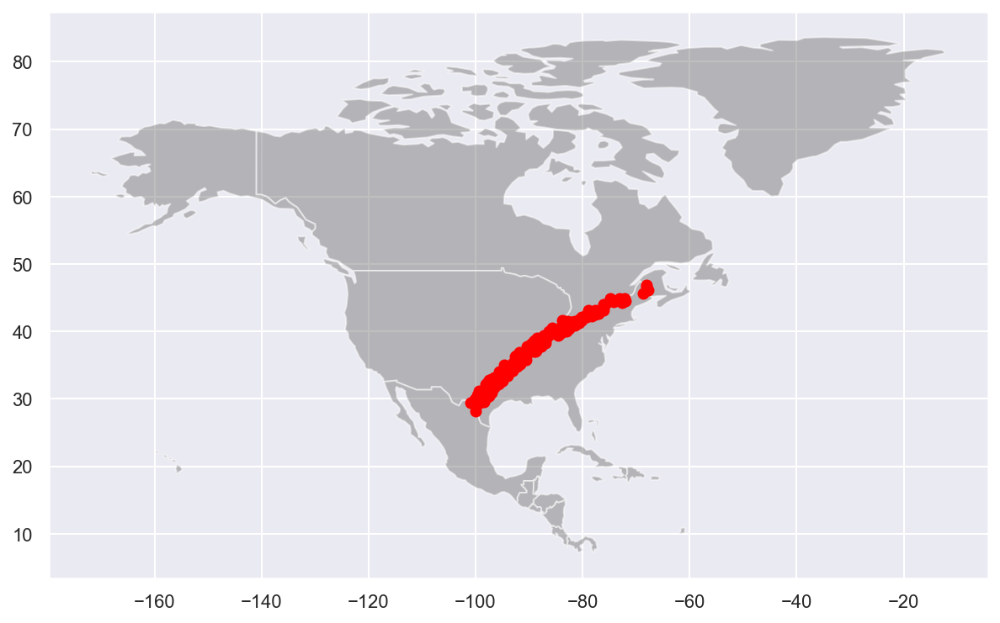

In [32]:
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))

# We restrict to North America.
fig, ax = plt.subplots(figsize=(10, 10))
world[world.continent == 'North America'].plot(
    color='grey', alpha = 0.5, ax=ax)

# We can now plot our ``GeoDataFrame``.

geo_stations_subset.plot(ax=ax, color='red')
plt.show()

In [48]:
subset_json = geo_stations_subset.to_json()
geo_stations_subset.to_file('subset.json', driver="GeoJSON")  

In [58]:
subset_map = folium.Map([39.0119, -98.4842], zoom_start=4, tiles='cartodbpositron')
fg=folium.FeatureGroup(name="Stations")

for lat,lon,name in zip(geo_stations_subset['LATITUDE'],geo_stations_subset['LONGITUDE'],geo_stations_subset['NAME']):
    fg.add_child(folium.Marker(location=[lat,lon],popup=(folium.Popup(name))))

subset_map.add_child(fg)

subset_map.add_child(folium.LayerControl())


In [59]:
subset_stations = ['HONDO MUNICIPAL AIRPORT, TX US',
                   'WACO REGIONAL AIRPORT, TX US',
                   'MOUNT IDA, AR US',
                   'POPLAR BLUFF MUNICIPAL AIRPORT, MO US',
                   'FAIRFIELD MUNICIPAL AIRPORT, IL US',
                   'INDIANAPOLIS INTERNATIONAL AIRPORT, IN US',
                   'MARION MUNICIPAL AIRPORT, OH US',
                   'CLEVELAND HOPKINS INTERNATIONAL AIRPORT, OH US',
                   'ROCHESTER GREATER INTERNATIONAL, NY US',
                   'SARANAC LAKE ADIRONDACK REGIONAL AIRPORT, NY US',
                   'NEWPORT STATE AIRPORT, VT US',
                   'PRESQUE ISLE MUNICIPAL AIRPORT, ME US']



obs_zone_subset = obs[obs['NAME'].isin(subset_stations)]
obs_zone_subset.shape

(162938, 21)

False    0.684598
True     0.315402
Name: CLEAR, dtype: float64


<AxesSubplot:>

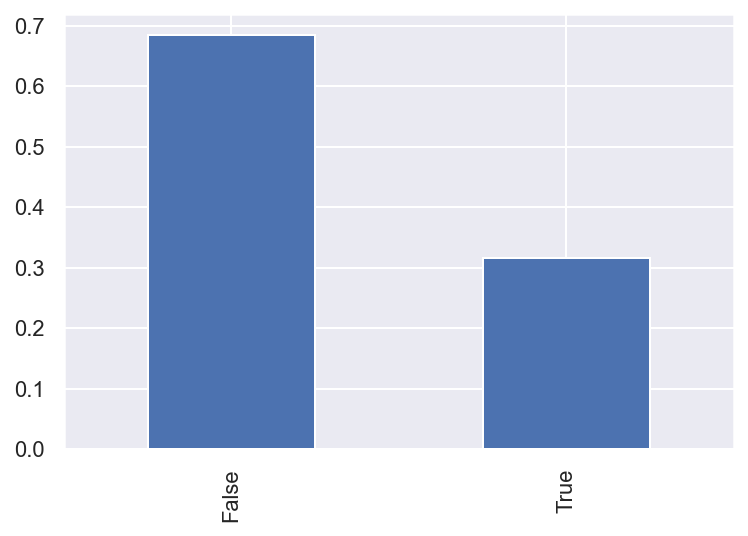

In [63]:
# Treating this like a simple logistic regression (not a time series)
target = obs_zone_subset.CLEAR.value_counts(normalize=True)
print(target)
target.plot(kind='bar')

In [64]:
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset.iloc[:, 5:18], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

train_df = X_train.copy()
train_df['CLEAR'] = y_train
train_df.head()

,LATITUDE,LONGITUDE,ELEVATION,ALTSE,DP,TEMP,PCP,RH,STP,VIS,WB_TEMP,WIND_DIR,WIND,CLEAR
2584484,44.39279,-74.20288,505.6,29.47,49.0,50.0,0.01,96.0,27.73,10.0,49.0,10.0,3.0,False
783377,36.76973,-90.32241,99.6,30.09,71.0,73.0,0.11,94.0,29.73,3.0,72.0,10.0,8.0,False
2337348,38.37861,-88.41250,132.9,30.26,26.0,36.0,0.00,66.0,29.79,10.0,32.0,340.0,5.0,False
1371940,40.61576,-83.06731,300.3,29.94,36.0,47.0,0.00,66.0,28.88,10.0,42.0,320.0,9.0,False
1722831,44.88333,-72.23333,278.9,29.96,61.0,72.0,0.00,69.0,28.98,10.0,65.0,170.0,5.0,True


In [68]:
subset_one = train_df.iloc[:, :4]
subset_one['CLEAR'] = y_train
subset_one

,LATITUDE,LONGITUDE,ELEVATION,ALTSE,CLEAR
2584484,44.39279,-74.20288,505.6,29.47,False
783377,36.76973,-90.32241,99.6,30.09,False
2337348,38.37861,-88.41250,132.9,30.26,False
1371940,40.61576,-83.06731,300.3,29.94,False
1722831,44.88333,-72.23333,278.9,29.96,True
...,...,...,...,...,...
2340779,38.37861,-88.41250,132.9,30.12,True
1999009,31.61796,-97.22830,151.9,29.90,True
2352832,38.37861,-88.41250,132.9,30.14,True
2497061,41.40568,-81.85191,236.8,29.87,False


In [71]:
subset_two = train_df.iloc[:, 4:8]
subset_two['CLEAR'] = y_train
subset_two

,DP,TEMP,PCP,RH,CLEAR
2584484,49.0,50.0,0.01,96.0,False
783377,71.0,73.0,0.11,94.0,False
2337348,26.0,36.0,0.00,66.0,False
1371940,36.0,47.0,0.00,66.0,False
1722831,61.0,72.0,0.00,69.0,True
...,...,...,...,...,...
2340779,42.0,63.0,0.00,46.0,True
1999009,55.0,66.0,0.00,68.0,True
2352832,64.0,66.0,0.00,94.0,True
2497061,26.0,31.0,0.01,82.0,False


In [72]:
subset_three = train_df.iloc[:, 8:13]
subset_three['CLEAR'] = y_train
subset_three

,STP,VIS,WB_TEMP,WIND_DIR,WIND,CLEAR
2584484,27.73,10.0,49.0,10.0,3.0,False
783377,29.73,3.0,72.0,10.0,8.0,False
2337348,29.79,10.0,32.0,340.0,5.0,False
1371940,28.88,10.0,42.0,320.0,9.0,False
1722831,28.98,10.0,65.0,170.0,5.0,True
...,...,...,...,...,...,...
2340779,29.65,10.0,52.0,160.0,5.0,True
1999009,29.35,10.0,60.0,160.0,10.0,True
2352832,29.67,10.0,65.0,190.0,3.0,True
2497061,29.01,2.0,29.0,170.0,8.0,False


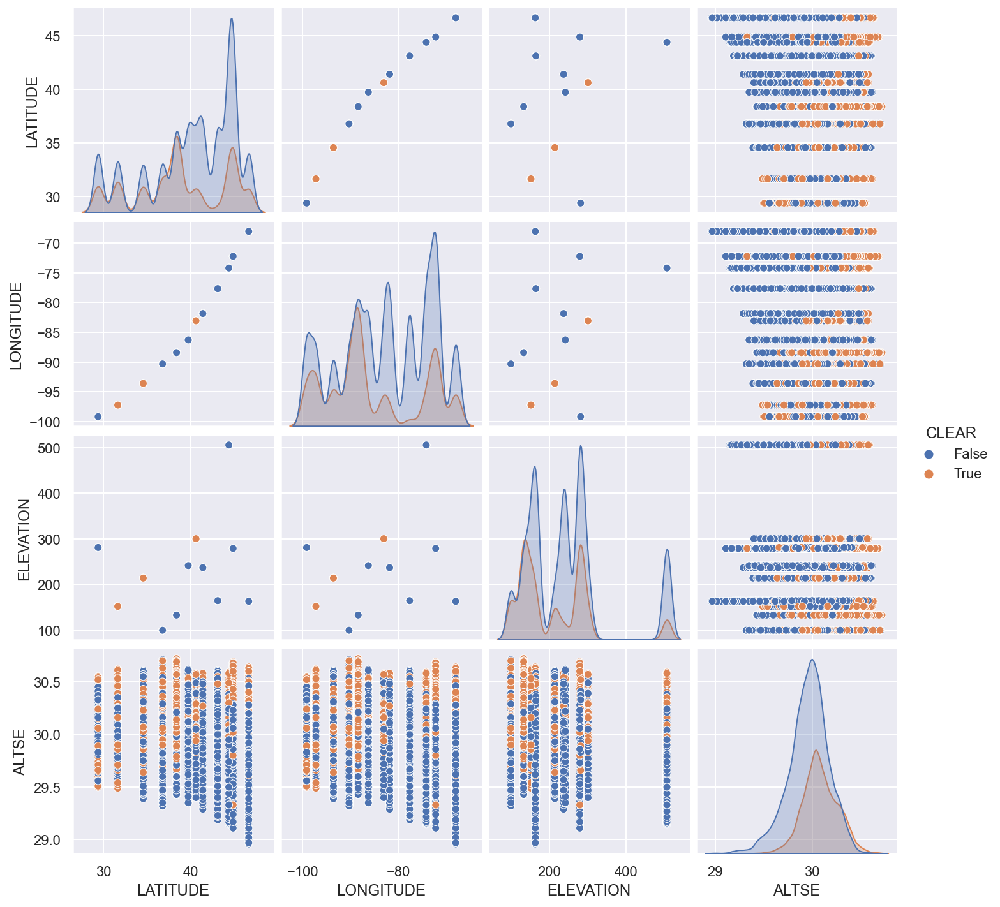

In [73]:
sns.pairplot(subset_one, hue='CLEAR');

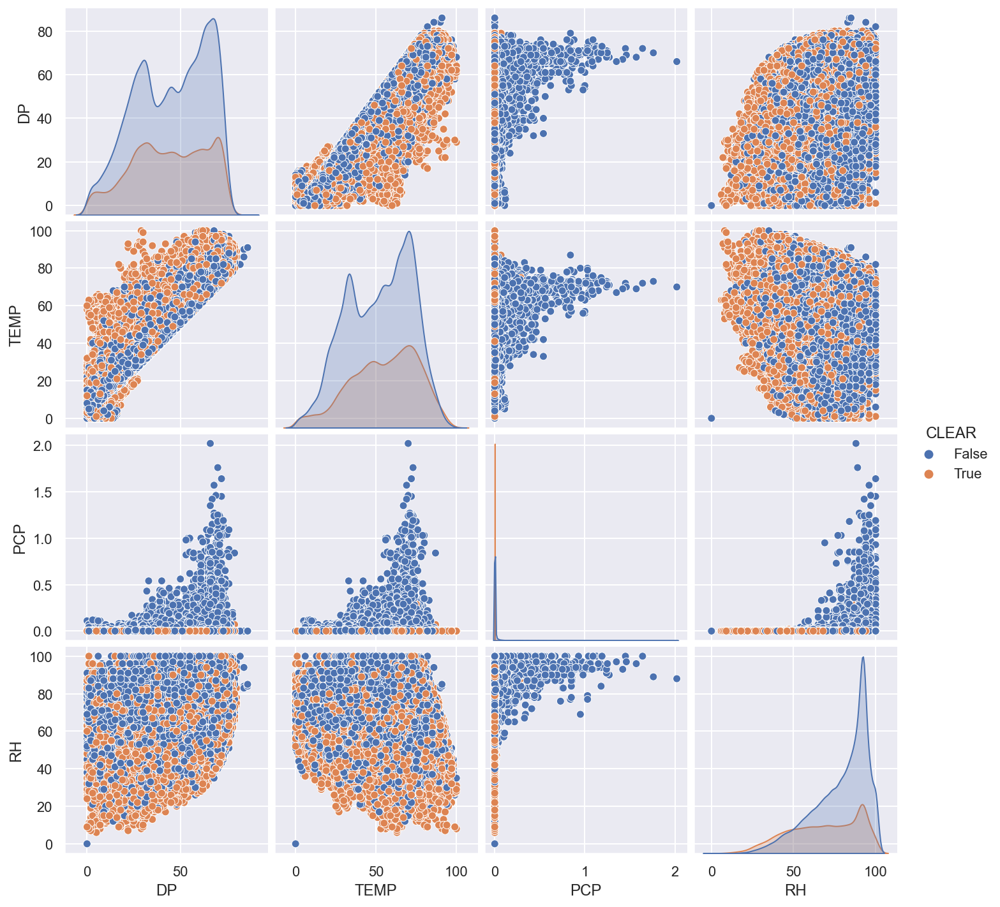

In [74]:
sns.pairplot(subset_two, hue='CLEAR');

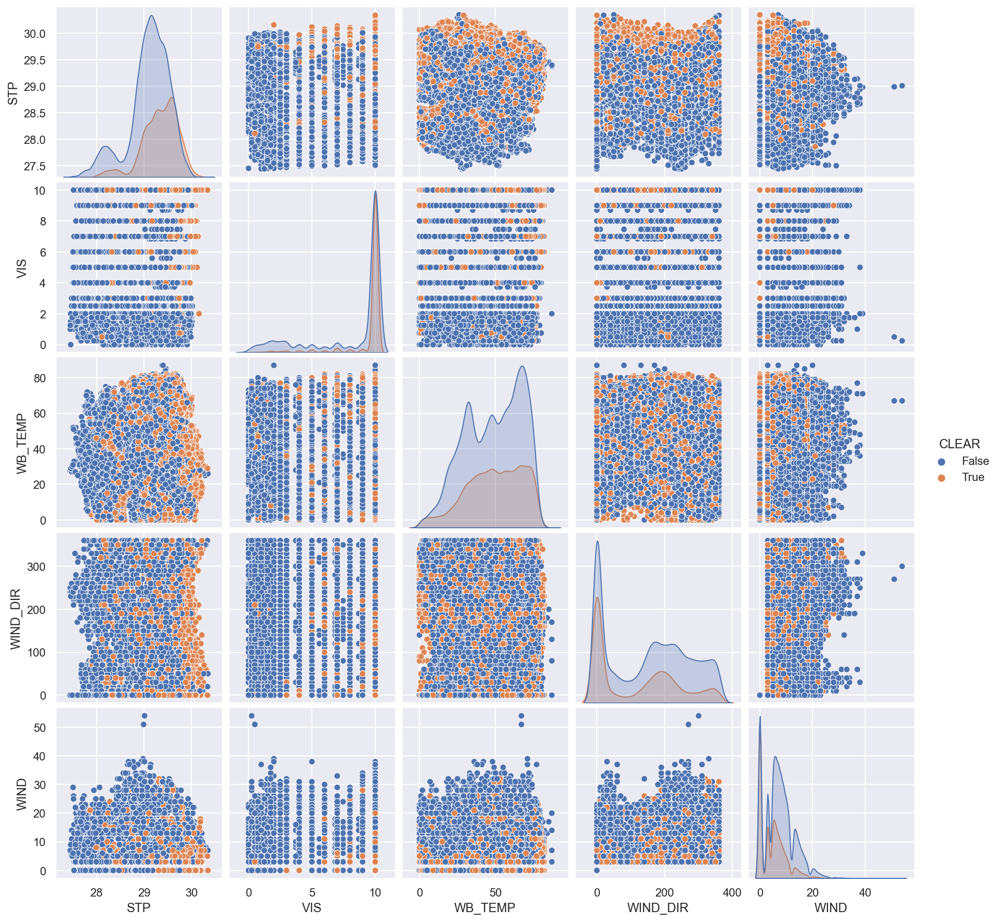

In [75]:
sns.pairplot(subset_three, hue='CLEAR');

In [76]:
np.mean(y_train)

0.31512850019179134

<AxesSubplot:>

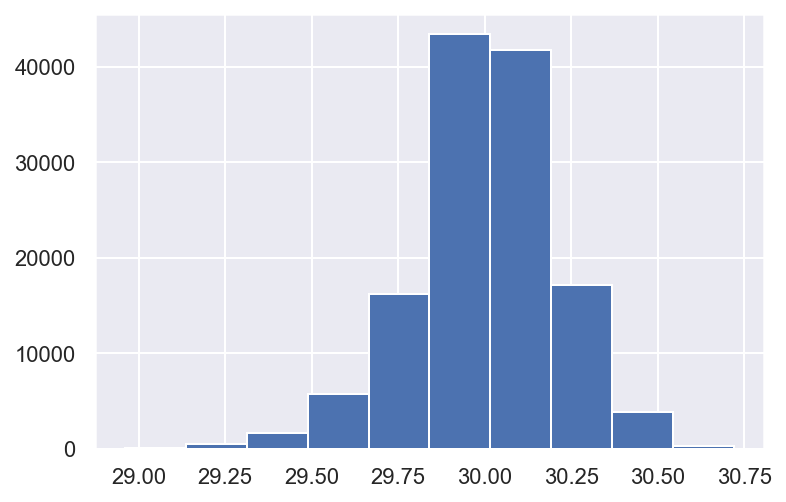

In [77]:
X_train.ALTSE.hist()

In [78]:
mask1 = (X_train.ALTSE>=29.3) & (X_train.ALTSE<=29.8)
mask2 = (X_train.ALTSE>=29.8) & (X_train.ALTSE<=30)
mask3 = (X_train.ALTSE>=30) & (X_train.ALTSE<=30.5)

In [79]:
np.mean(y_train[mask1]), np.mean(y_train[mask2]), np.mean(y_train[mask3])

(0.10960258010819808, 0.25619780508066986, 0.40796550716164864)

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/2760041483.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


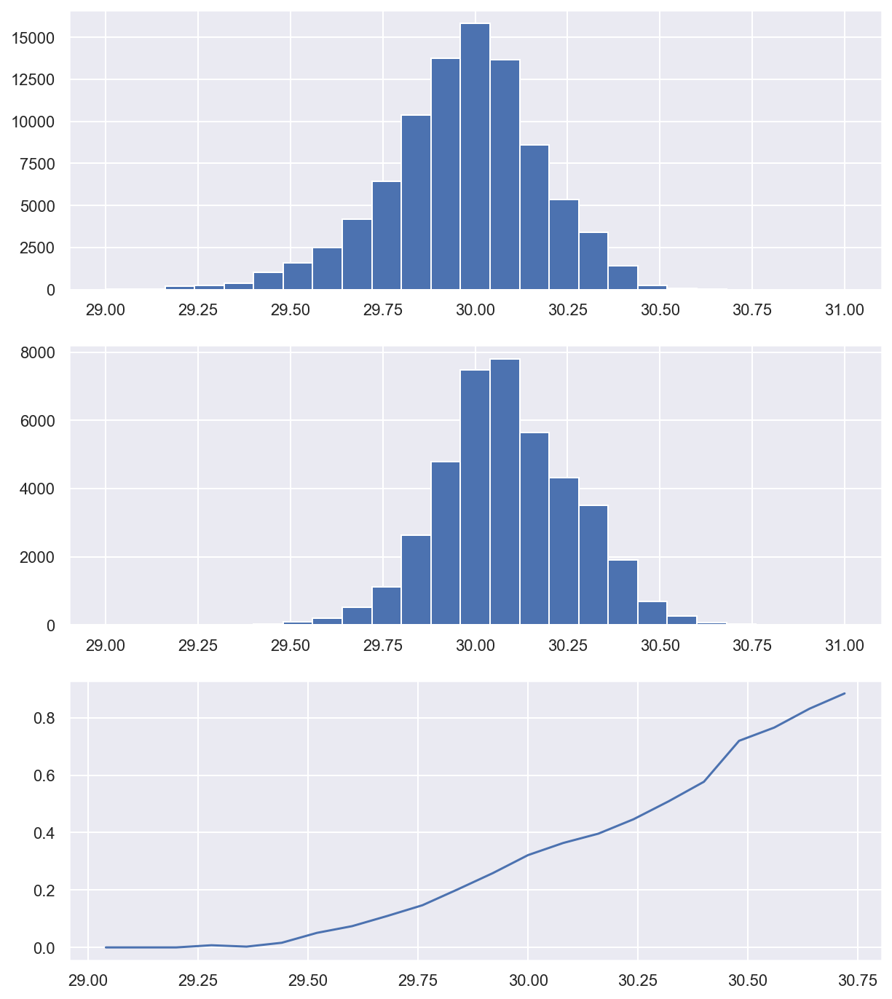

In [80]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'ALTSE'], bins=25, range=(29,31))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'ALTSE'], bins=25, range=(29,31))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

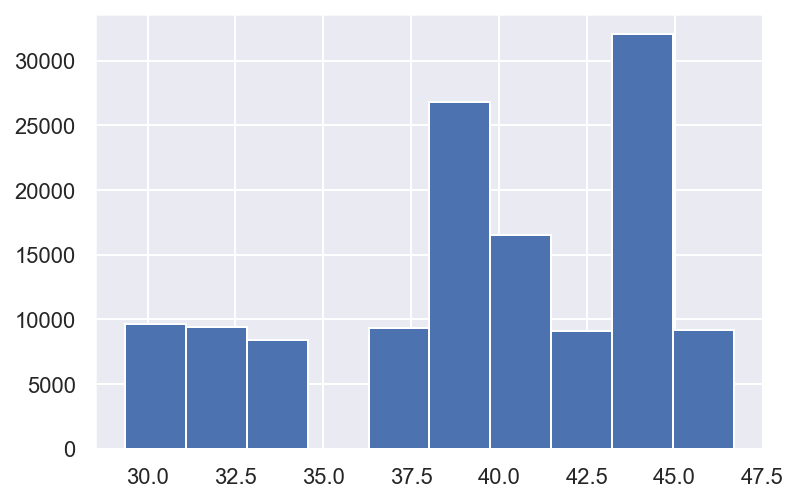

In [81]:
X_train.LATITUDE.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/1489230209.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


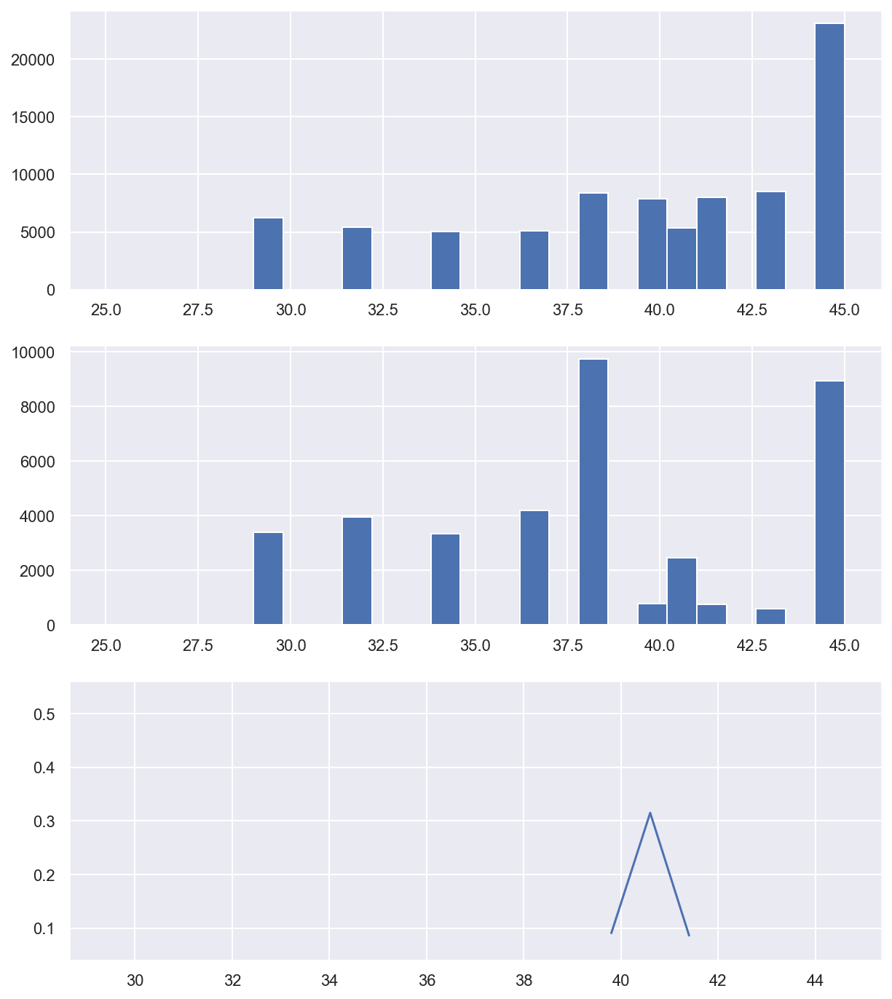

In [82]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'LATITUDE'], bins=25, range=(25,45))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'LATITUDE'], bins=25, range=(25,45))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

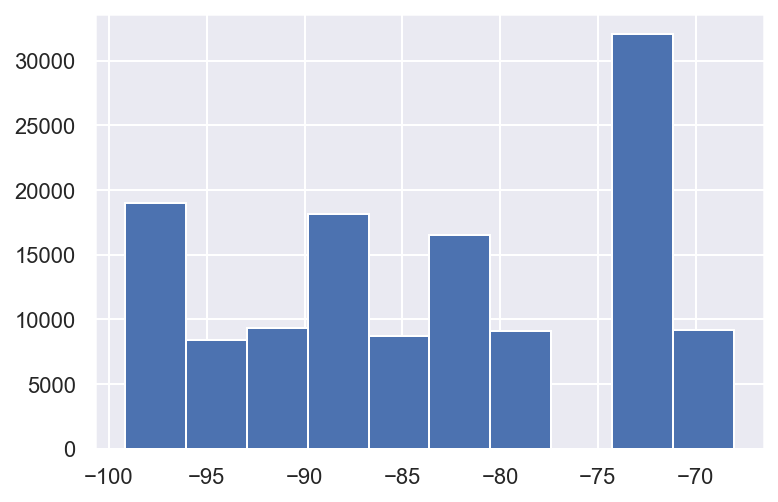

In [83]:
X_train.LONGITUDE.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/1551329854.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


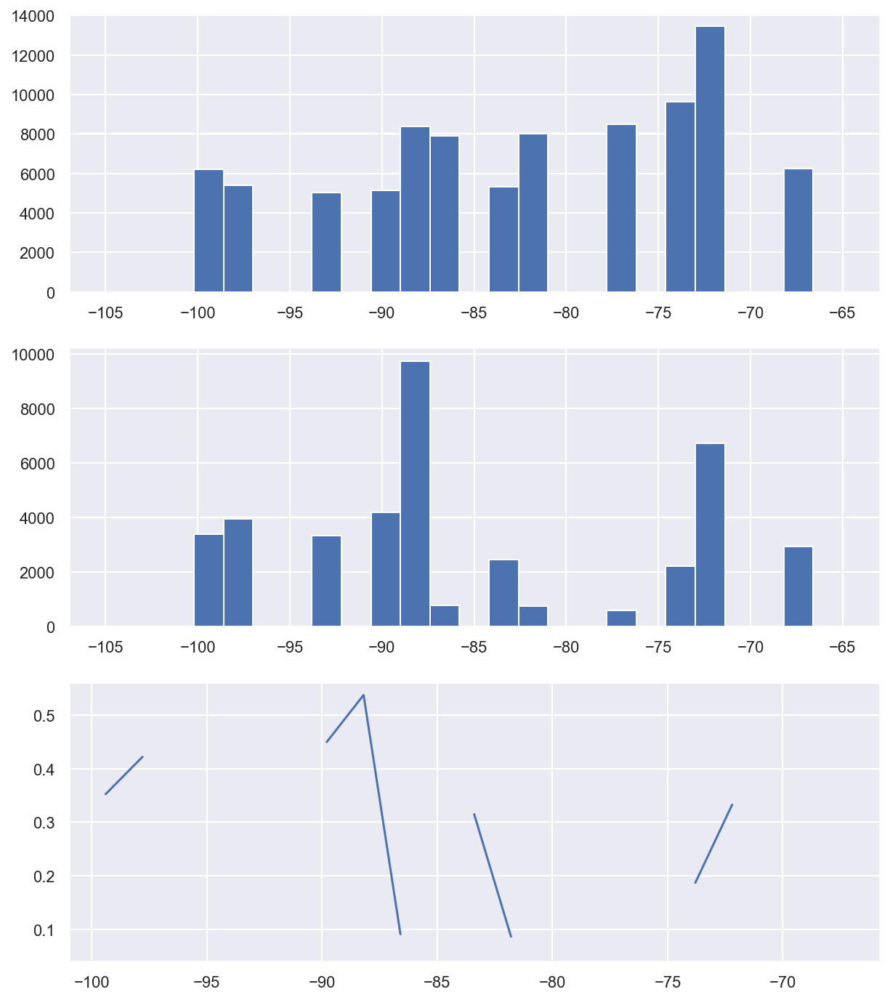

In [84]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'LONGITUDE'], bins=25, range=(-105,-65))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'LONGITUDE'], bins=25, range=(-105,-65))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

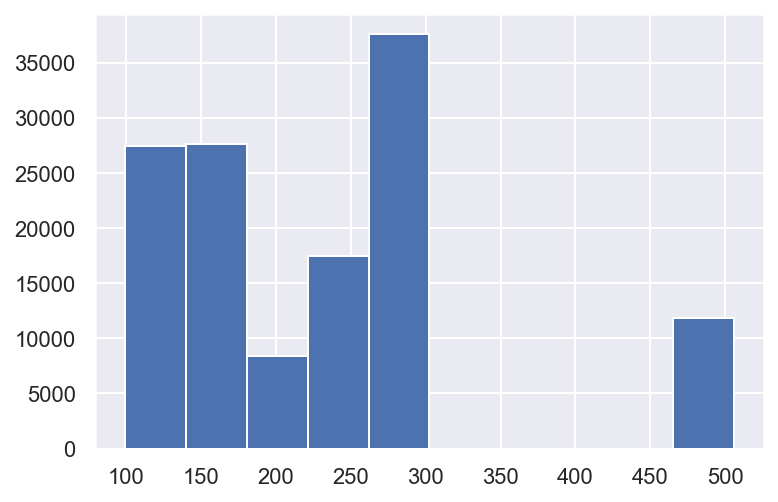

In [85]:
X_train.ELEVATION.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/2819103137.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


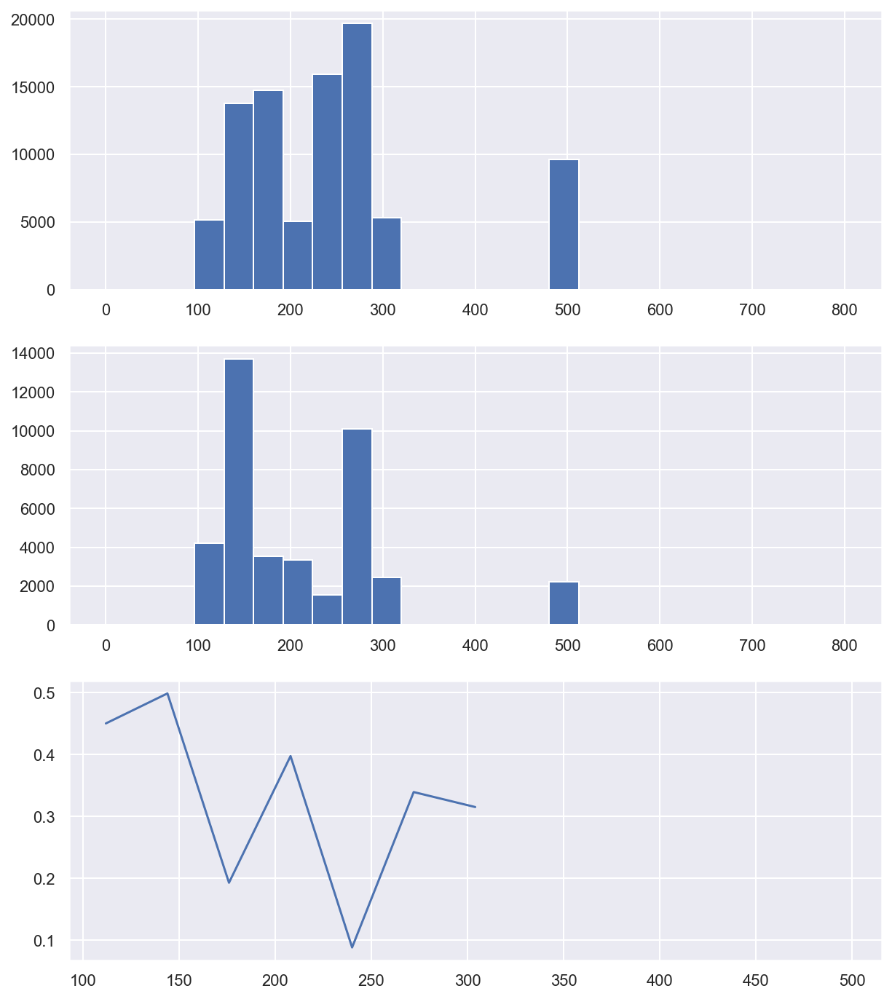

In [86]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'ELEVATION'], bins=25, range=(0,800))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'ELEVATION'], bins=25, range=(0,800))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

# Next five features

<AxesSubplot:>

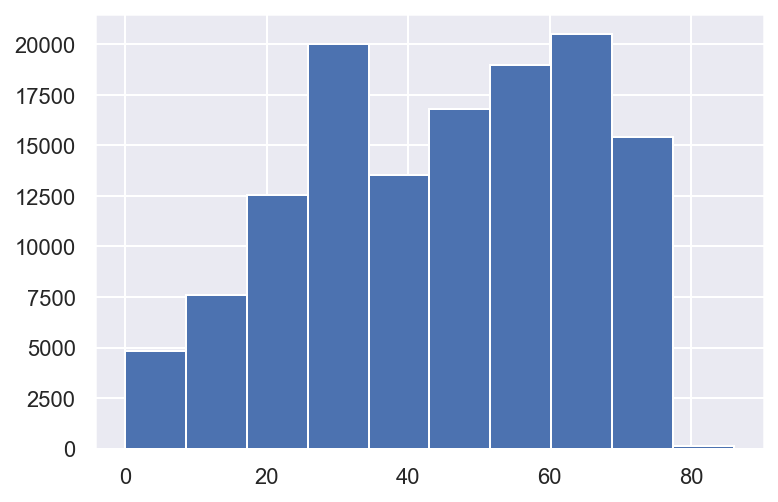

In [87]:
X_train.DP.hist()

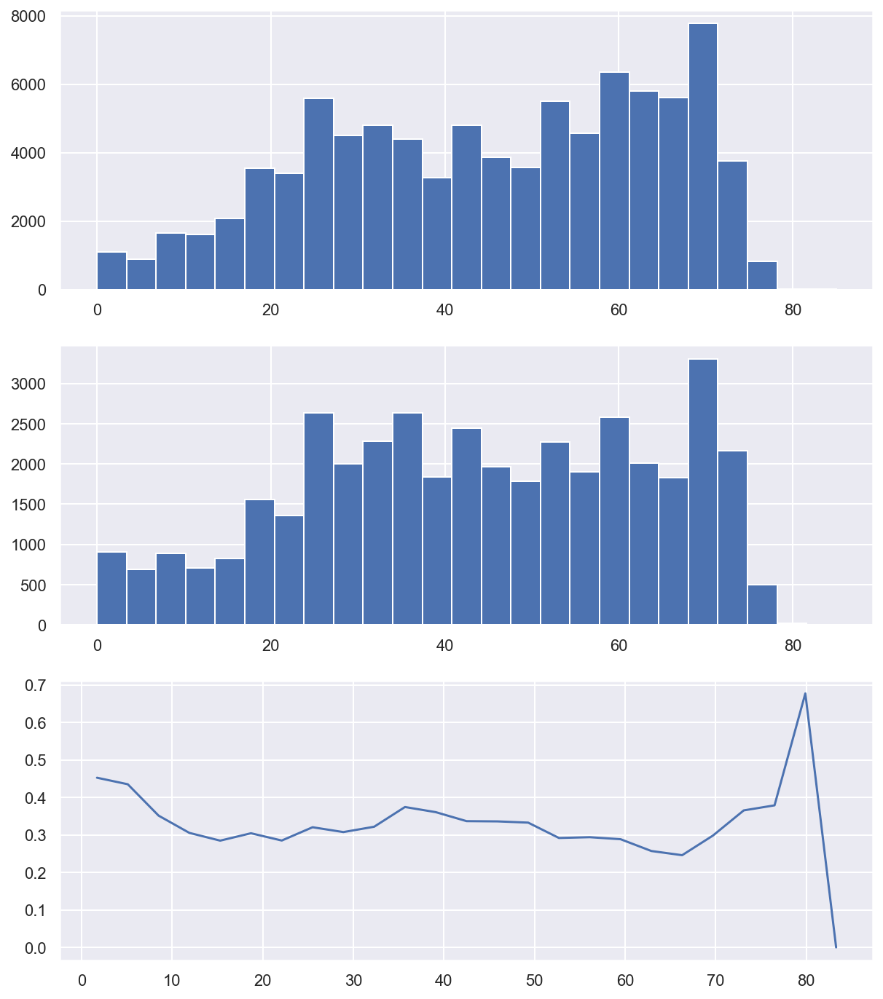

In [88]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'DP'], bins=25, range=(0,85))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'DP'], bins=25, range=(0,85))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

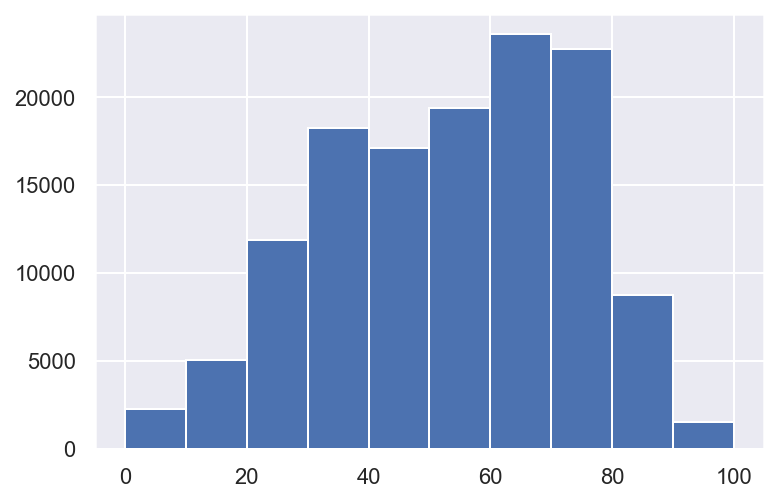

In [89]:
X_train.TEMP.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/244648368.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


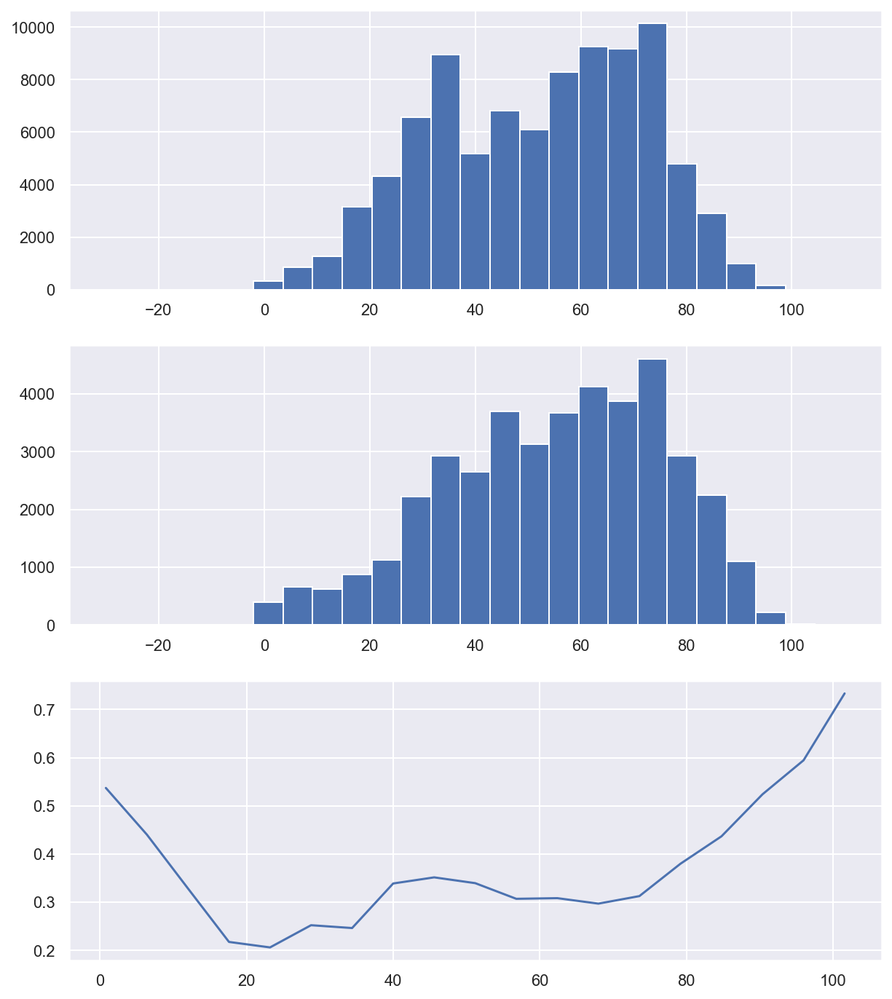

In [90]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'TEMP'], bins=25, range=(-30,110))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'TEMP'], bins=25, range=(-30,110))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

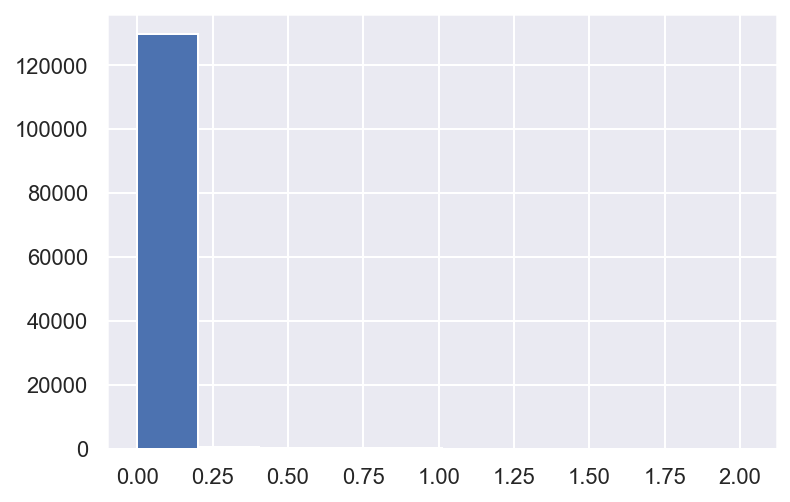

In [91]:
X_train.PCP.hist()

<AxesSubplot:>

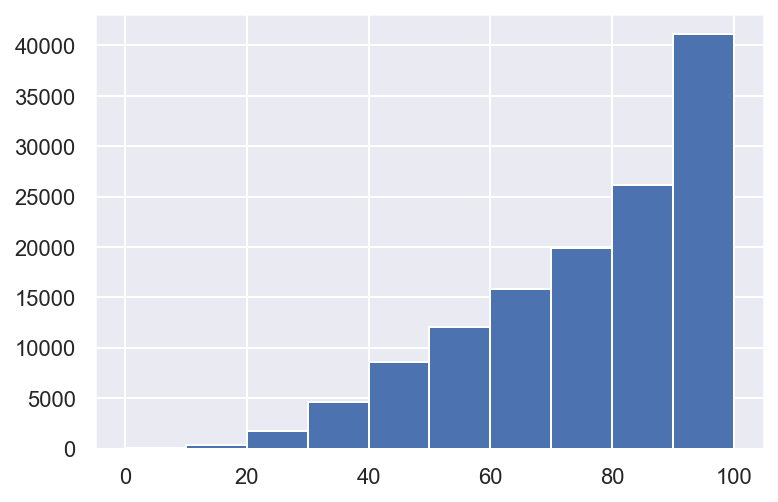

In [92]:
X_train.RH.hist()

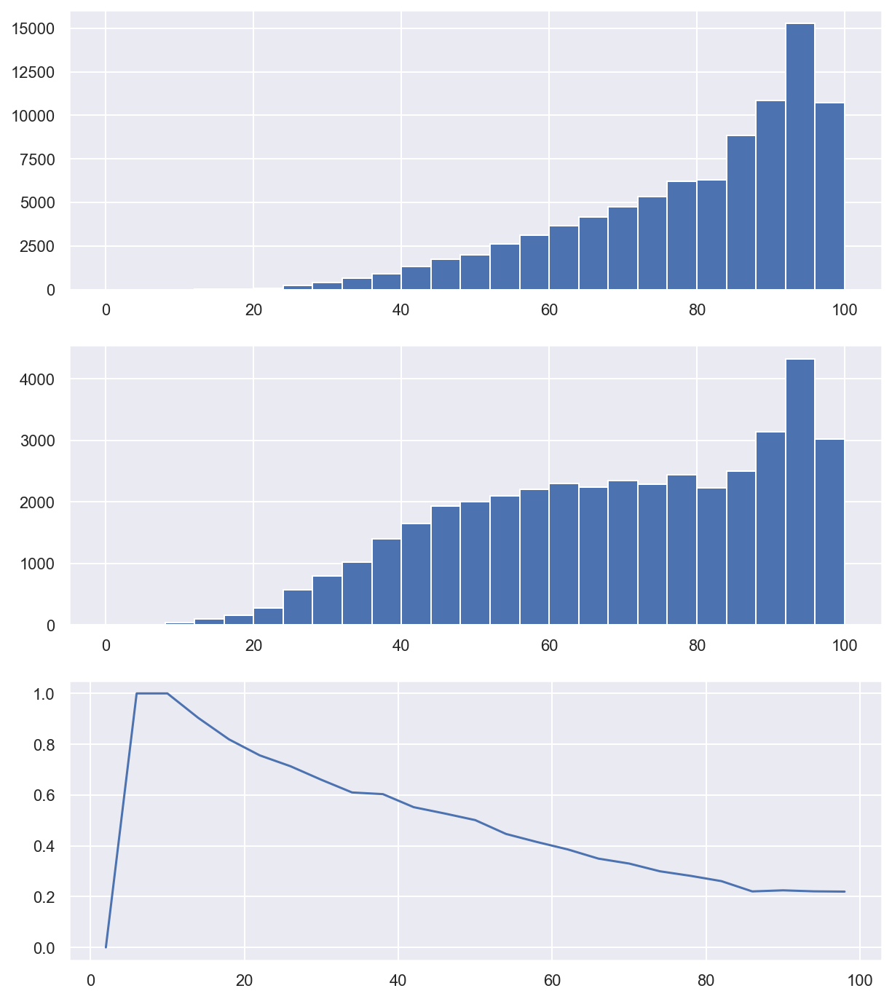

In [94]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'RH'], bins=25, range=(0,100))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'RH'], bins=25, range=(0,100))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

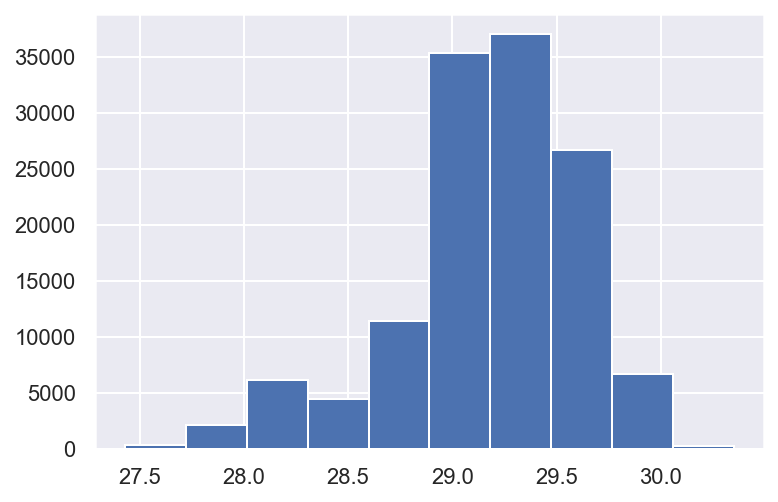

In [95]:
X_train.STP.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/3630600052.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


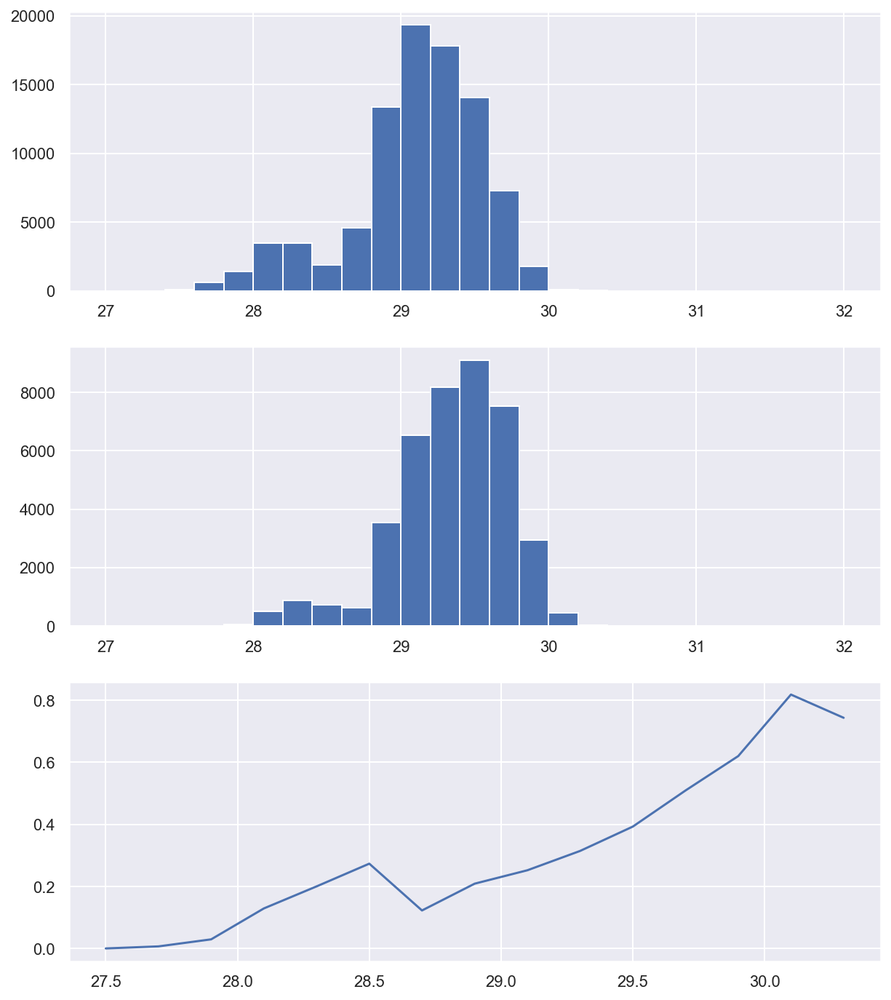

In [96]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'STP'], bins=25, range=(27,32))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'STP'], bins=25, range=(27,32))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

# Last five features

<AxesSubplot:>

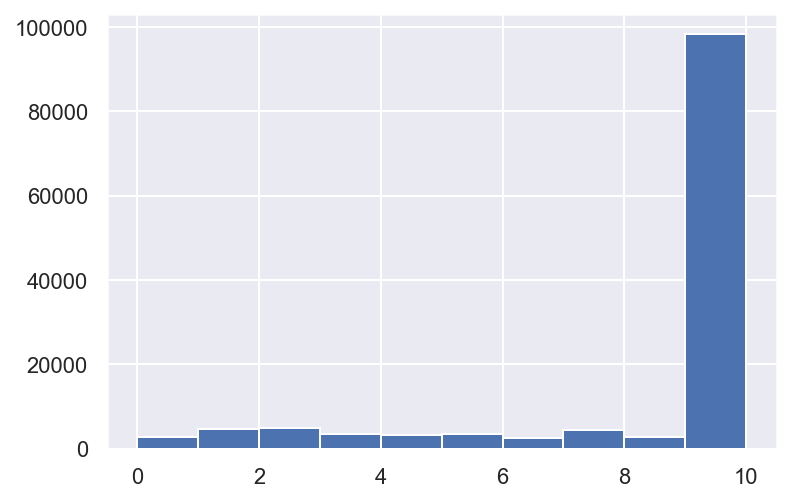

In [97]:
X_train.VIS.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/3210710549.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


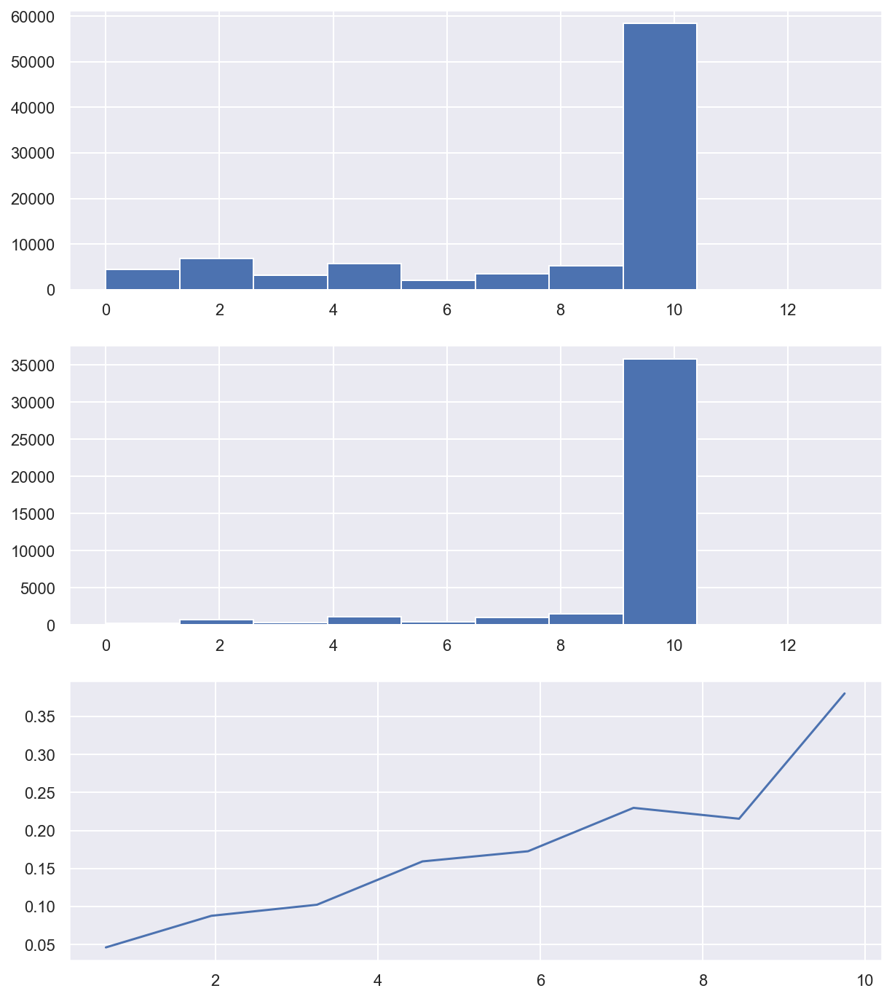

In [98]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'VIS'], bins=10, range=(0,13))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'VIS'], bins=10, range=(0,13))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

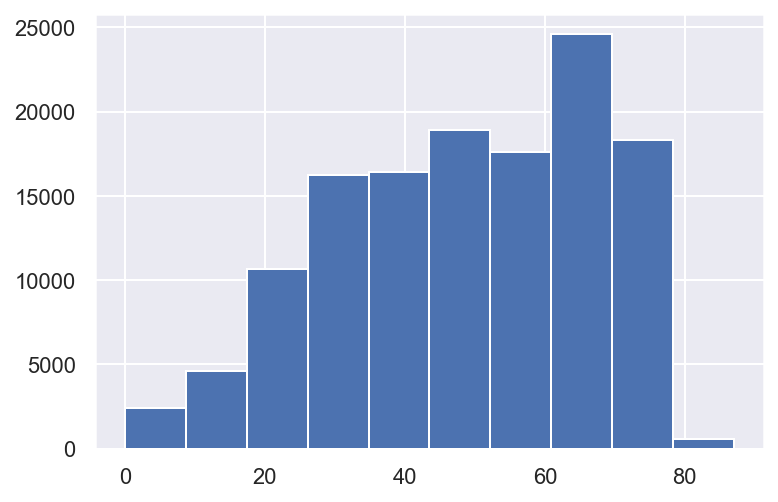

In [99]:
X_train.WB_TEMP.hist()

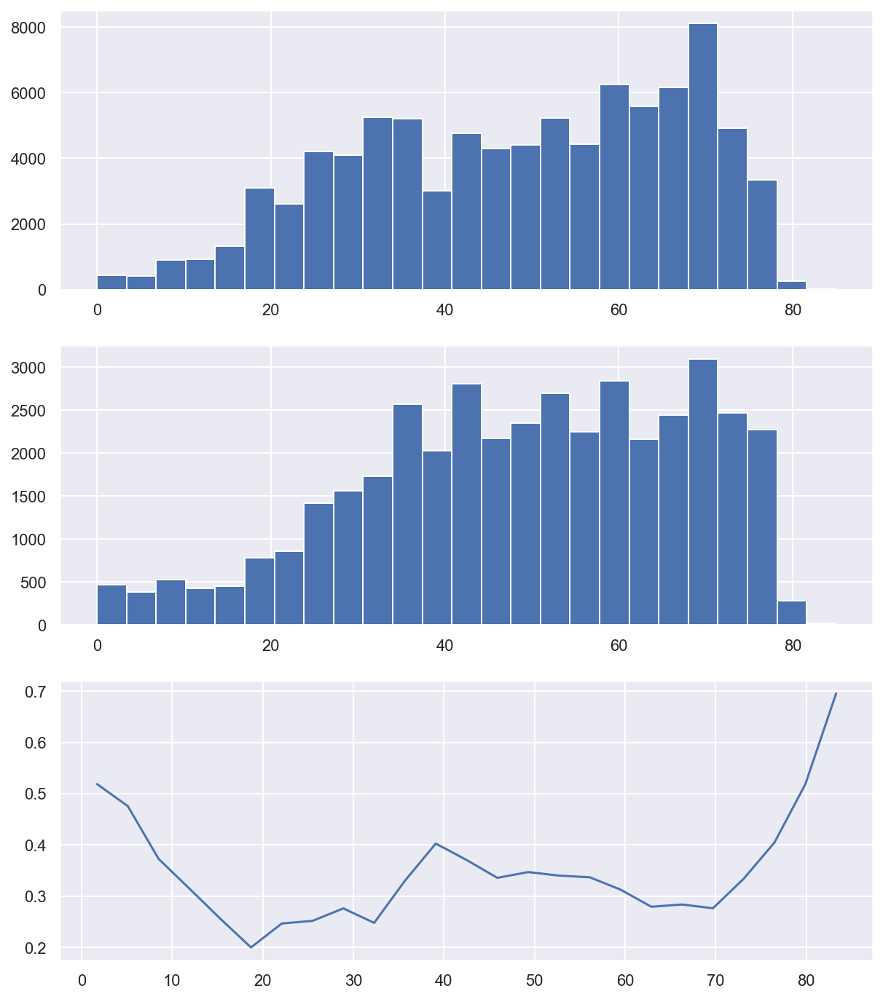

In [100]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'WB_TEMP'], bins=25, range=(0,85))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'WB_TEMP'], bins=25, range=(0,85))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

<AxesSubplot:>

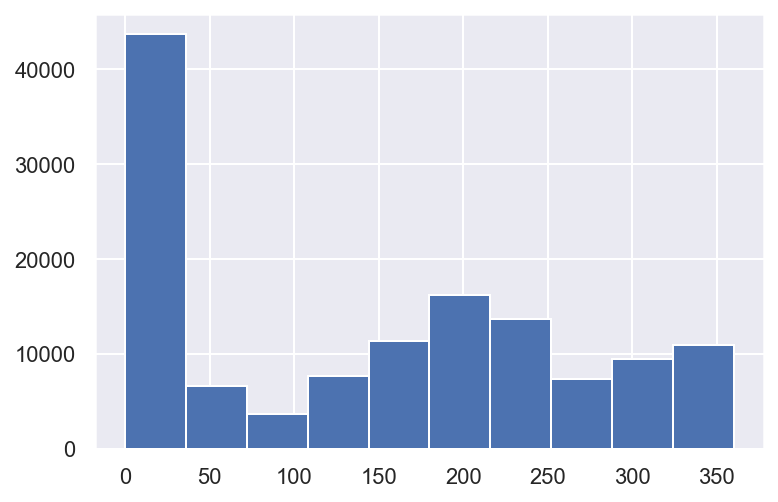

In [101]:
X_train.WIND_DIR.hist()

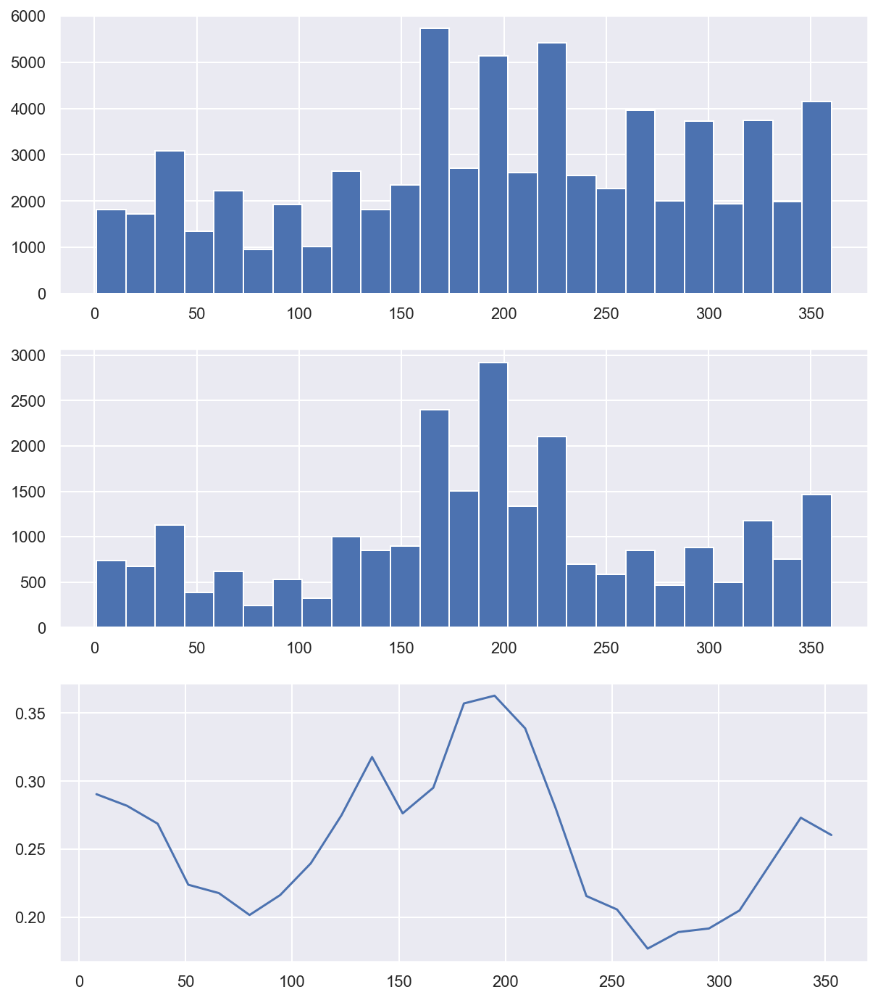

In [118]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'WIND_DIR'], bins=25, range=(1,360))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'WIND_DIR'], bins=25, range=(1,360))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

plt.savefig('wind_dir.png')

<AxesSubplot:>

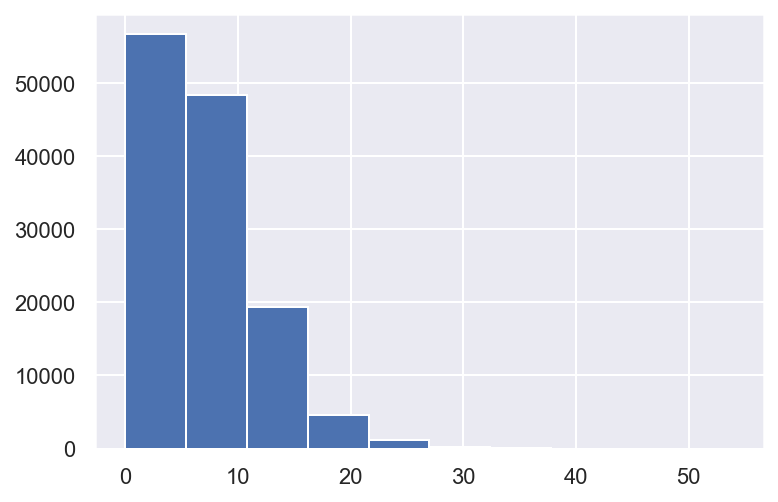

In [103]:
X_train.WIND.hist()

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/3908010669.py:5: RuntimeWarning: invalid value encountered in true_divide
  ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));


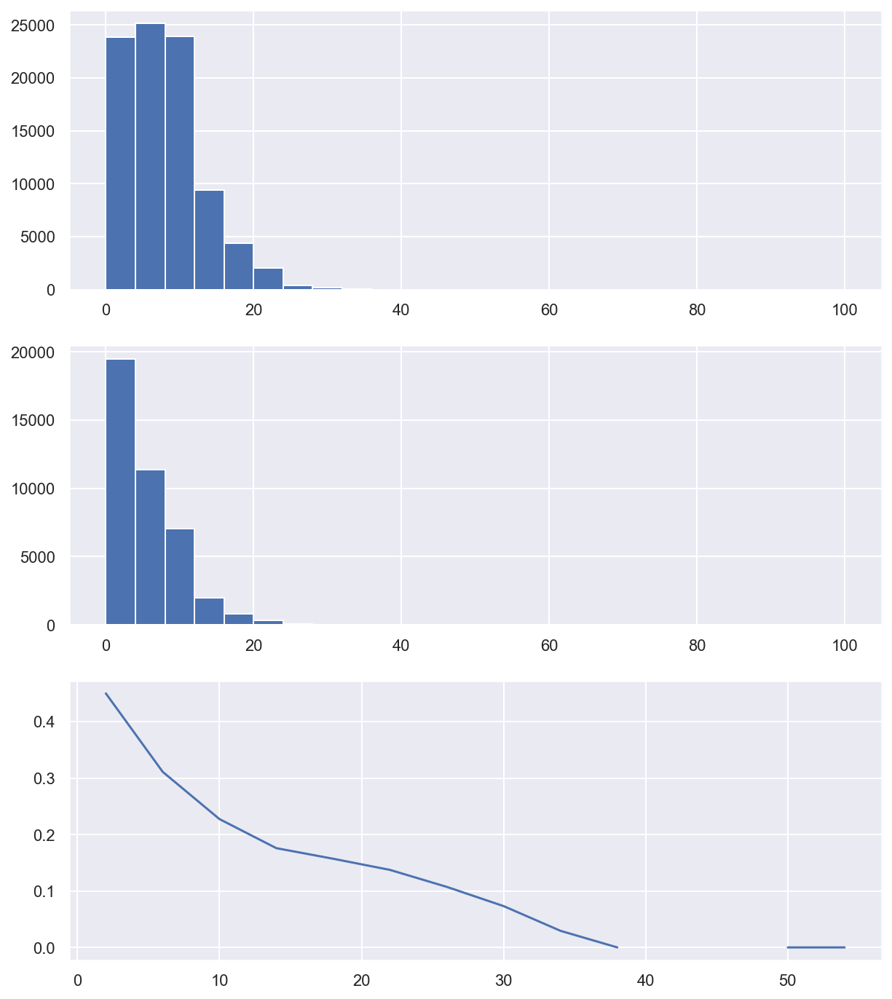

In [104]:
fig, ax = plt.subplots(3, 1, figsize=(10, 12))  # 3 Rows, 1 Col

count0, bins_0, _ = ax[0].hist(X_train.loc[(y_train==0),'WIND'], bins=25, range=(0,100))
count1, bins_1, _ = ax[1].hist(X_train.loc[(y_train==1),'WIND'], bins=25, range=(0,100))
ax[2].plot((bins_0[:-1]+bins_0[1:])/2,count1/(count1 + count0));

# Model Individual

In [106]:
for col in X_train.columns:
    print(col)
    X_tr = X_train[[col]]
    X_te = X_test[[col]]
    lr_model = LogisticRegression()
    lr_model.fit(X_tr,y_train)
    y_prob_pred_test = lr_model.predict_proba(X_te)[:,1]
    print(log_loss(y_test,y_prob_pred_test))

LATITUDE
0.6139279851713212
LONGITUDE
0.6141794491509566
ELEVATION
0.6124625259461559
ALTSE
0.5858042443937286
DP
0.6235455031524422
TEMP
0.6216958406003482
PCP
0.607948521638535
RH
0.5903705764581649
STP
0.589093301639735
VIS
0.5924864664198702
WB_TEMP
0.6240032408767672
WIND_DIR
0.6148062648241394
WIND
0.5990413812062908


In [105]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

/Users/noether/miniforge3/envs/eclipse/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7544687380130418

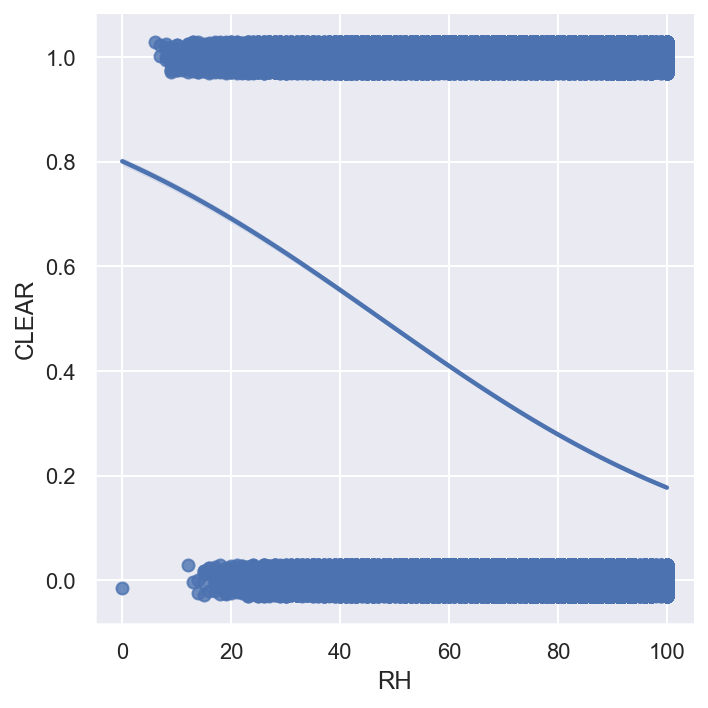

In [116]:
sns.lmplot(x='RH', y='CLEAR', data=train_df,
           logistic=True, y_jitter=.03);
plt.savefig('rh.png')

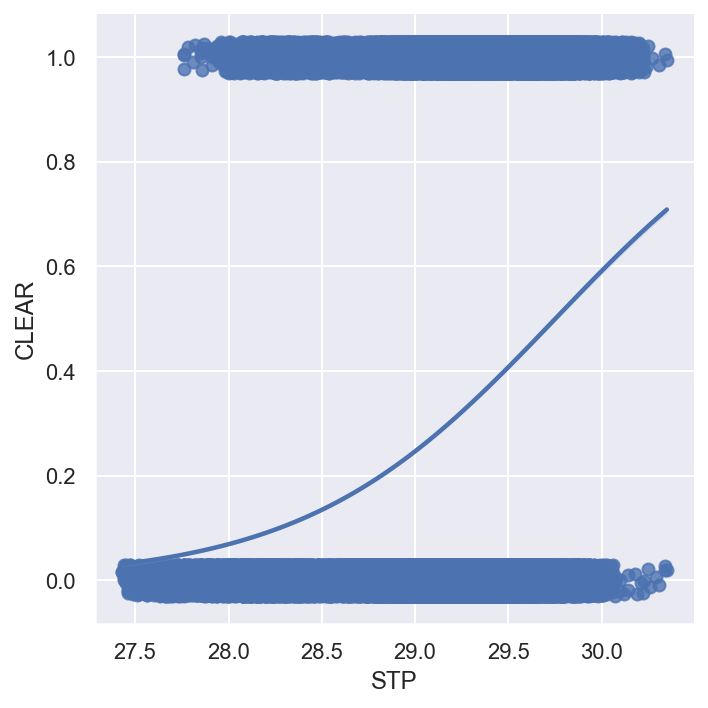

In [109]:
sns.lmplot(x='STP', y='CLEAR', data=train_df,
           logistic=True, y_jitter=.03);

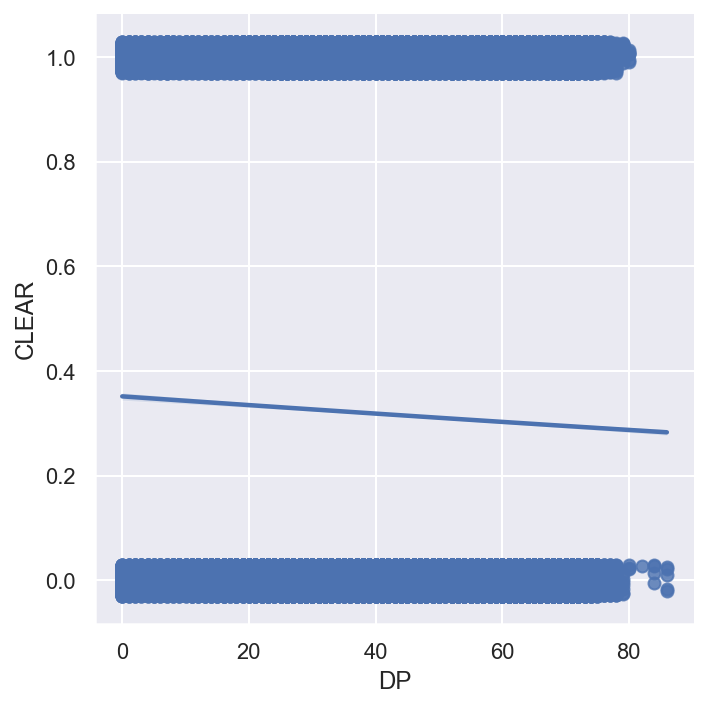

In [110]:
sns.lmplot(x='DP', y='CLEAR', data=train_df,
           logistic=True, y_jitter=.03);

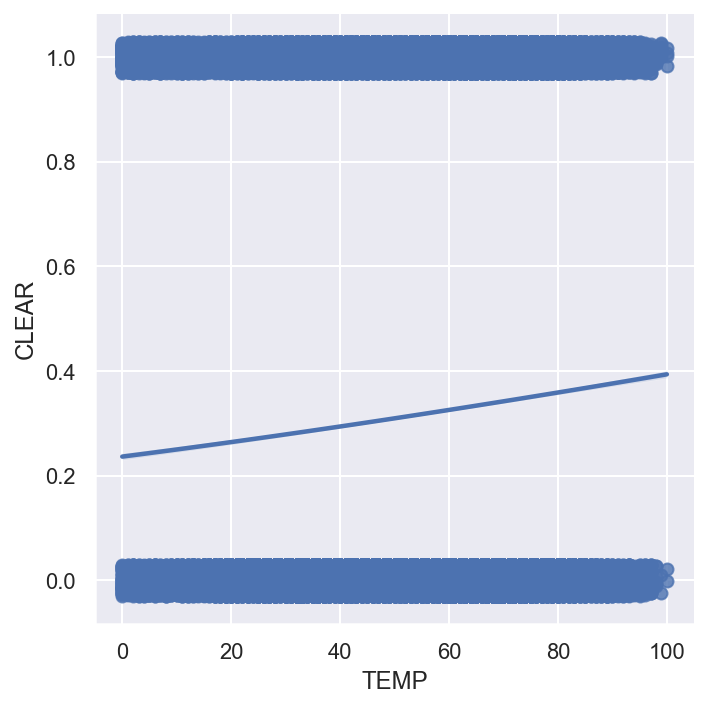

In [111]:
sns.lmplot(x='TEMP', y='CLEAR', data=train_df,
           logistic=True, y_jitter=.03);

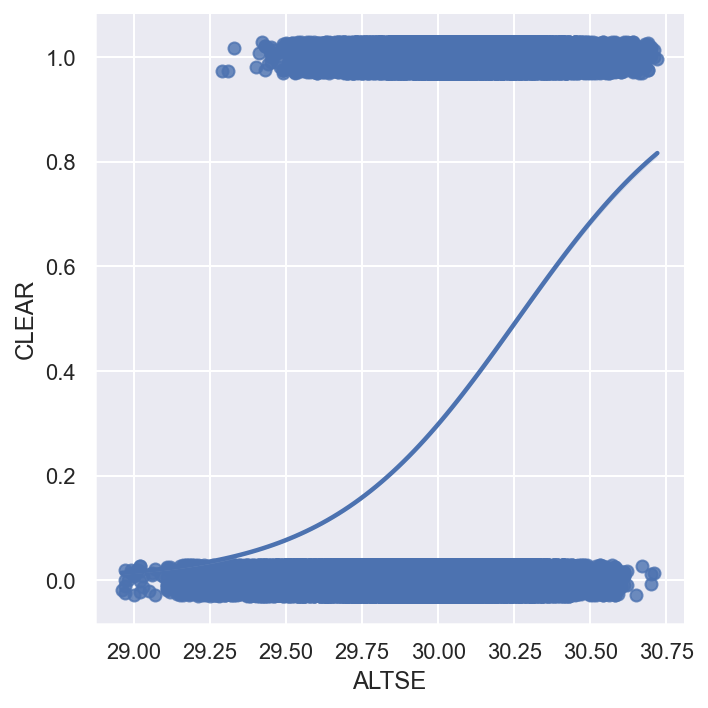

In [117]:
sns.lmplot(x='ALTSE', y='CLEAR', data=train_df,
           logistic=True, y_jitter=.03);
plt.savefig('altse.png')

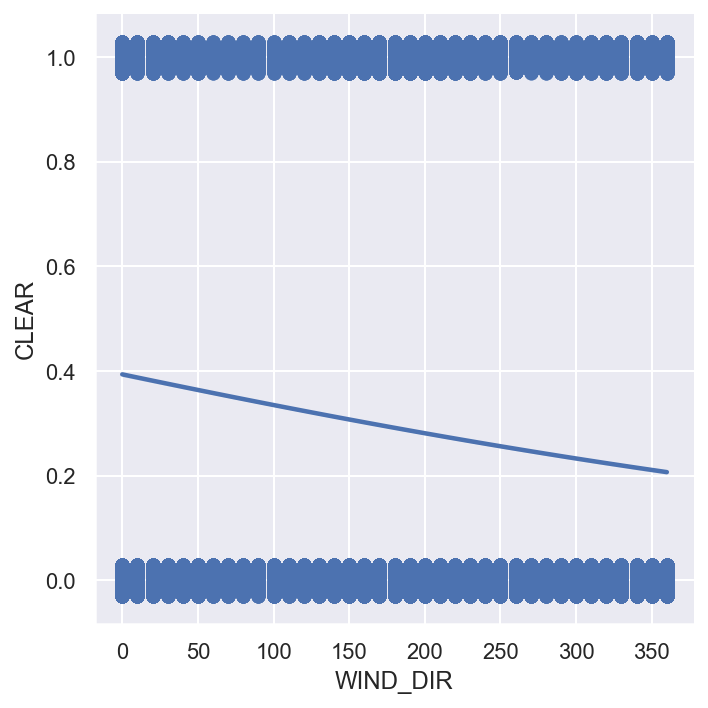

In [113]:
sns.lmplot(x='WIND_DIR', y='CLEAR', data=train_df,
           logistic=True, y_jitter=.03);

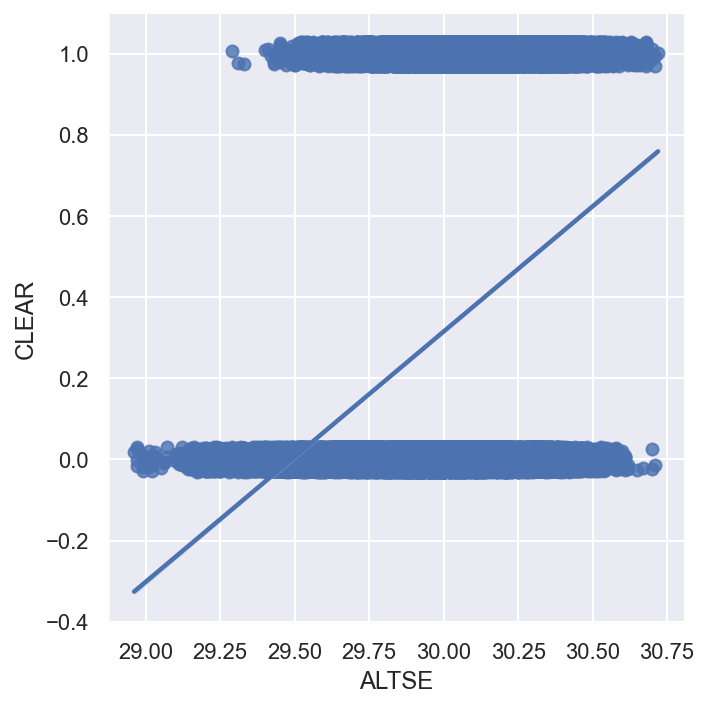

In [114]:
sns.lmplot(x='ALTSE', y='CLEAR', data=train_df,
           logistic=False, y_jitter=.03);

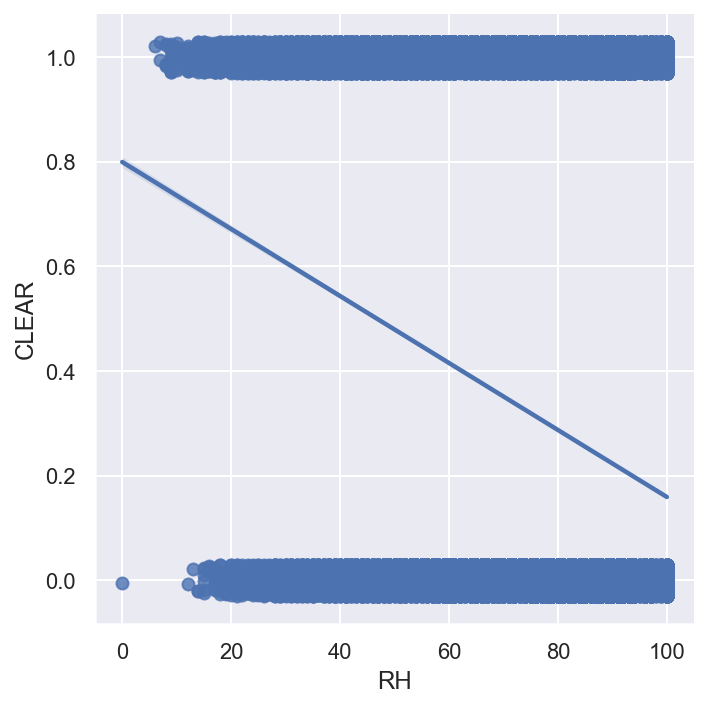

In [115]:
sns.lmplot(x='RH', y='CLEAR', data=train_df,
           logistic=False, y_jitter=.03);

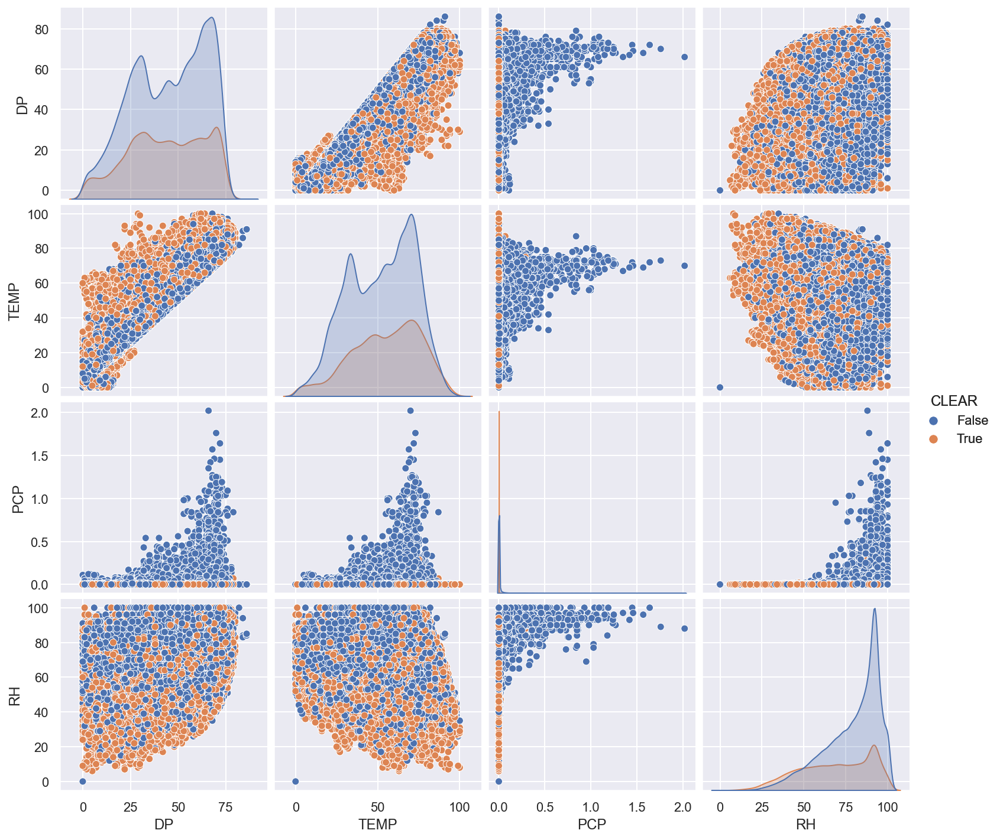

In [121]:
g = sns.pairplot(subset_two, hue='CLEAR')
g.map_offdiag(sns.scatterplot)
g.add_legend()

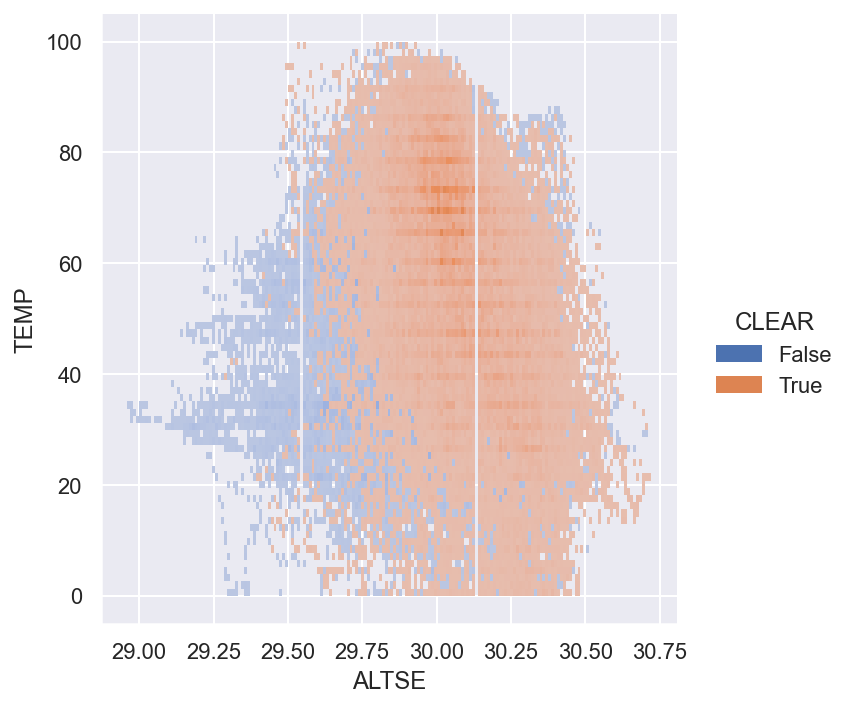

In [134]:
sns.displot(train_df, x='ALTSE', y='TEMP', hue='CLEAR')

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/947619919.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  interest['CLEAR'] = y_train


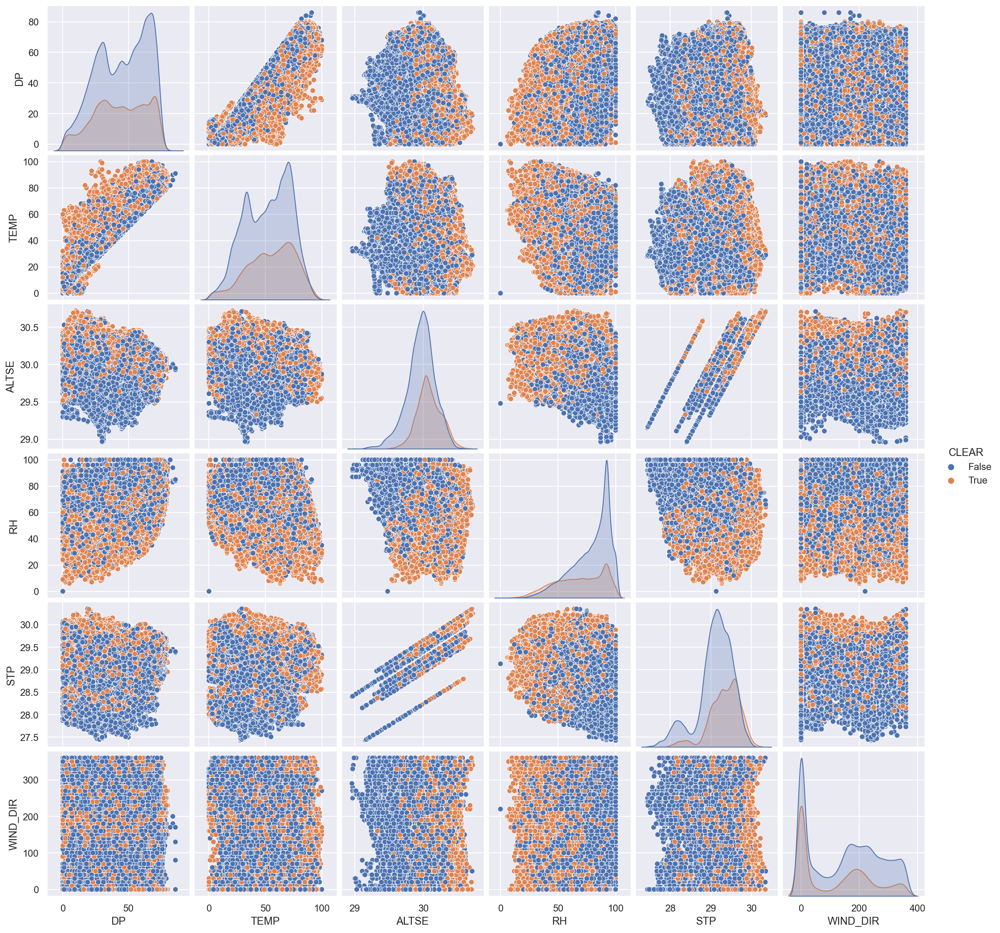

In [150]:
# interest = train_df['DP','TEMP','ALTSE','RH','STP','WIND_DIR']
interest = train_df[['DP','TEMP','ALTSE','RH','STP','WIND_DIR']]

interest['CLEAR'] = y_train
interest

sns.pairplot(interest, hue='CLEAR')

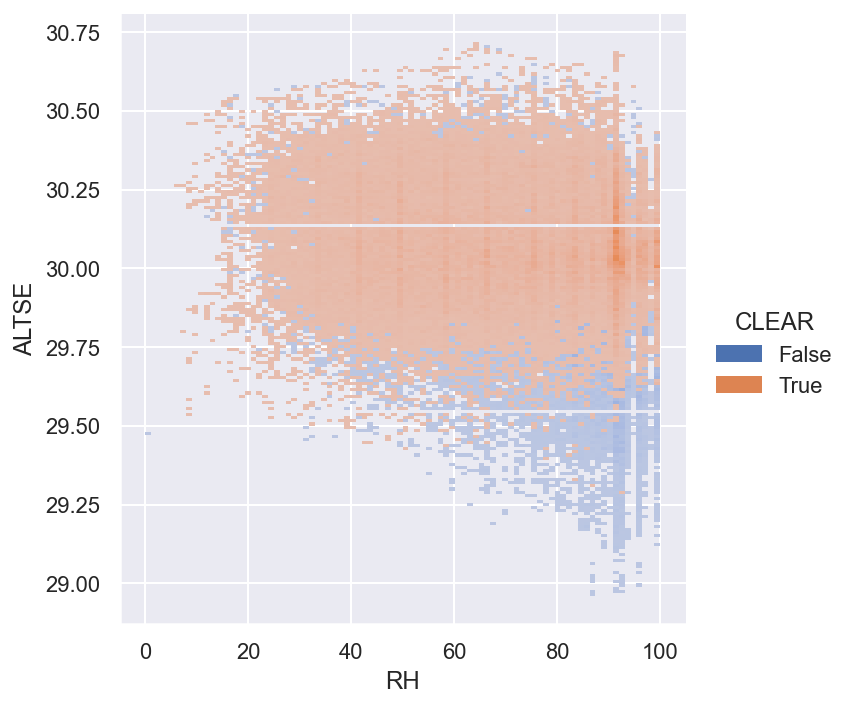

In [158]:
sns.displot(train_df, x='RH', y='ALTSE', hue='CLEAR')

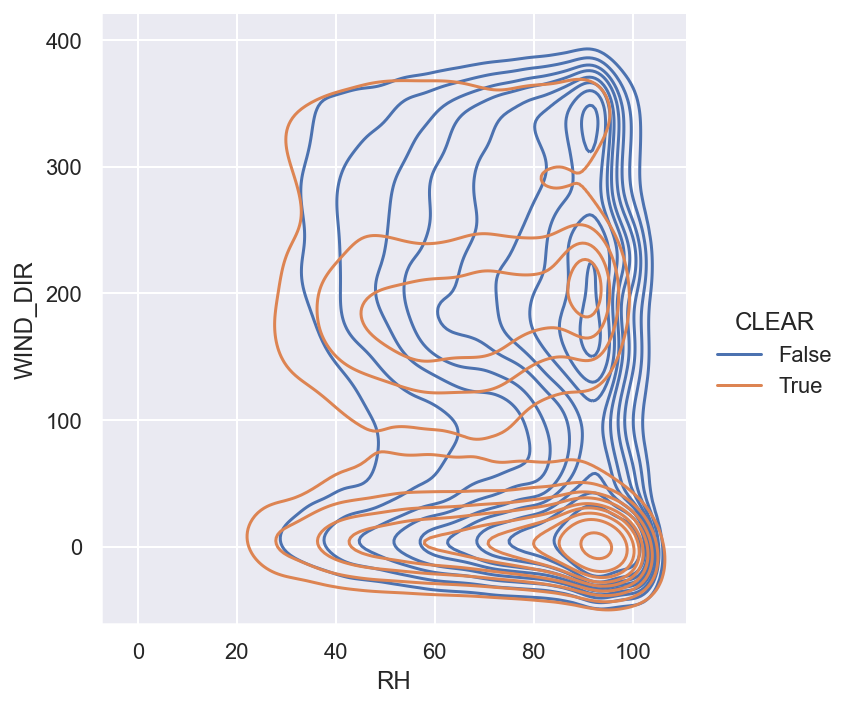

In [159]:
sns.displot(train_df, x='RH', y='WIND_DIR', hue='CLEAR', kind='kde')

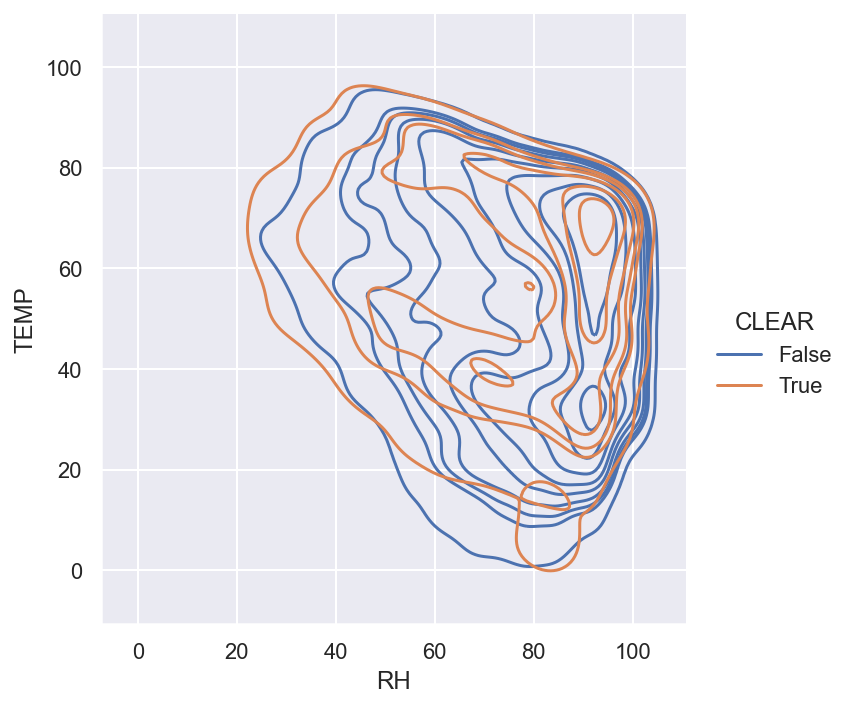

In [162]:
sns.displot(train_df, x='RH', y='TEMP', hue='CLEAR', kind='kde')

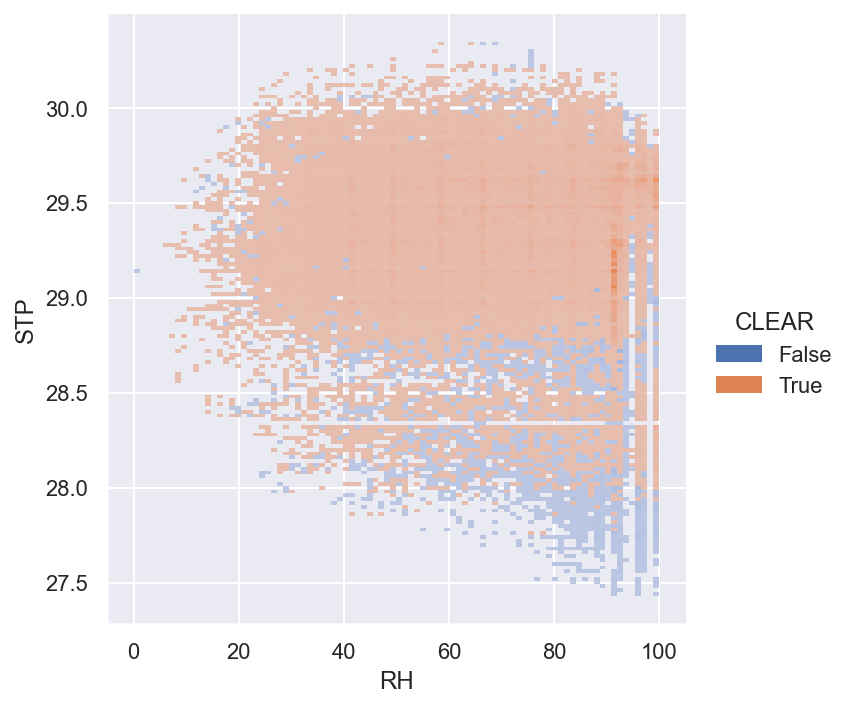

In [164]:
sns.displot(train_df, x='RH', y='STP', hue='CLEAR')

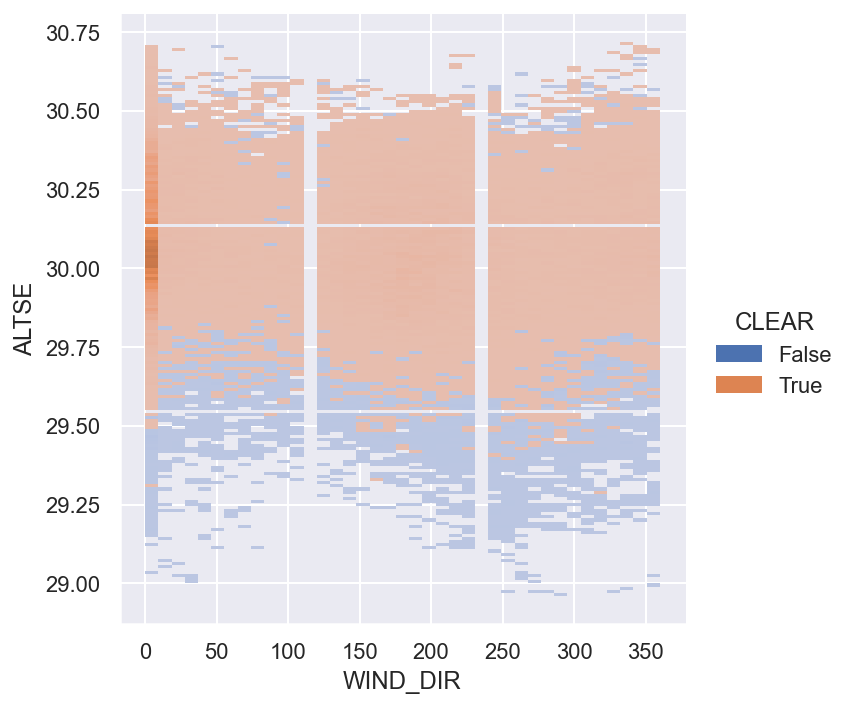

In [165]:
sns.displot(train_df, x='WIND_DIR', y='ALTSE', hue='CLEAR')

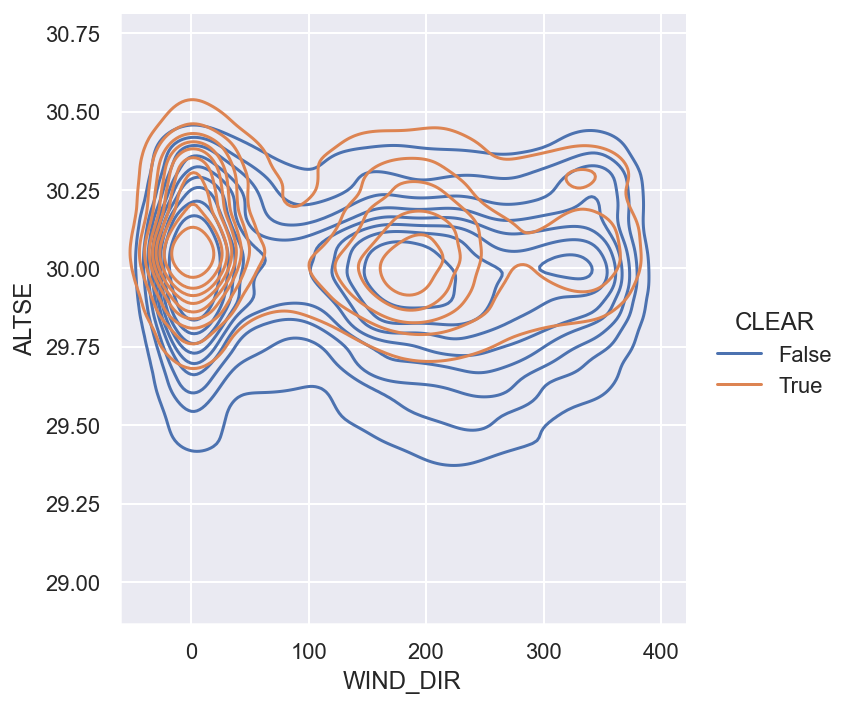

In [166]:
sns.displot(train_df, x='WIND_DIR', y='ALTSE', hue='CLEAR', kind='kde')

/var/folders/_g/0w700wks7s1f9mzvhbcn7vvc0000gn/T/ipykernel_8293/3123420489.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rh_altse_wind_dir_df['CLEAR'] = y_train


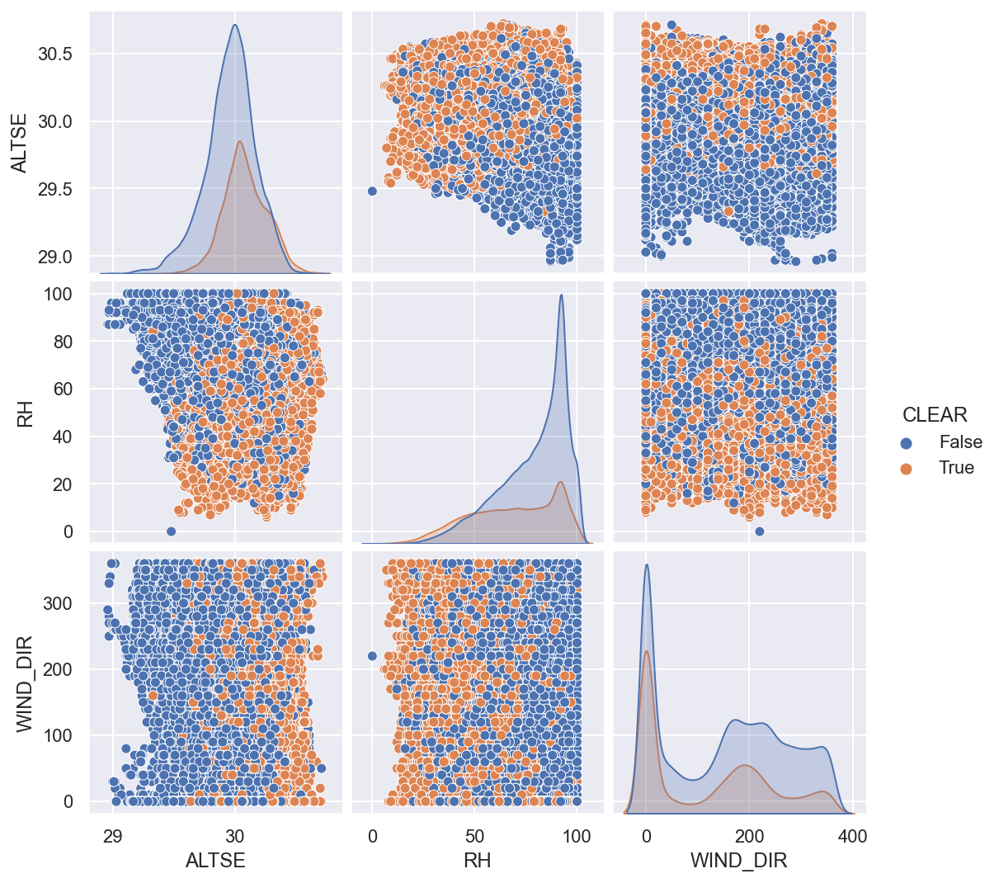

In [175]:
rh_altse_wind_dir_df = train_df[['ALTSE','RH','WIND_DIR']]

rh_altse_wind_dir_df['CLEAR'] = y_train

sns.pairplot(rh_altse_wind_dir_df, hue='CLEAR')

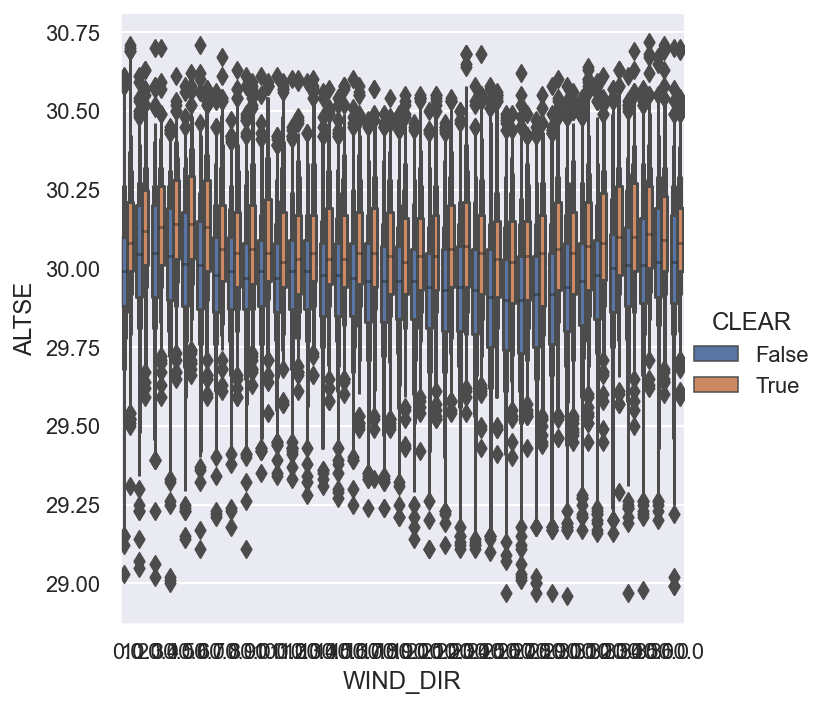

In [172]:
sns.catplot(x='WIND_DIR', y='ALTSE', hue='CLEAR', kind="boxen", data=train_df)

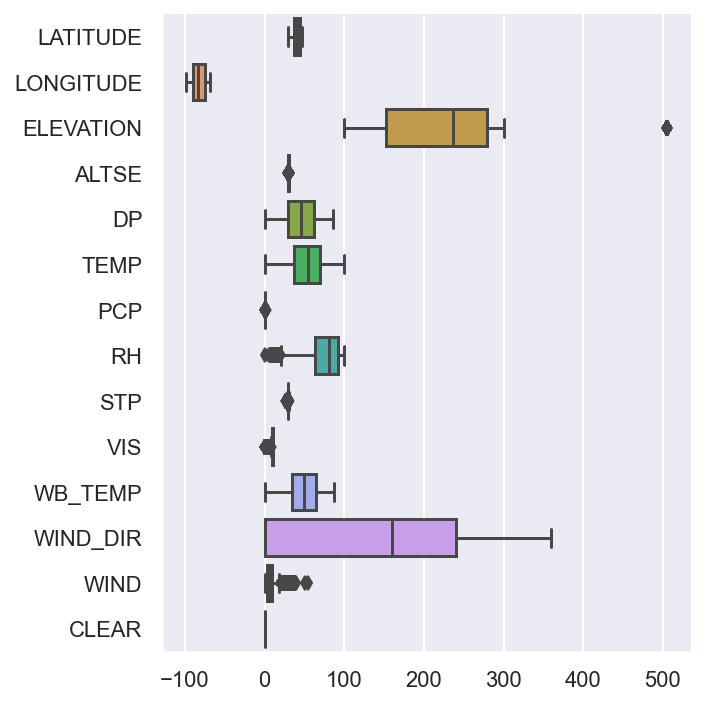

In [173]:
sns.catplot(data=train_df, orient="h", kind="box")

In [176]:
rh_altse_wind_dir = train_df[['ALTSE','RH','WIND_DIR']]
rh_altse_wind_dir


,ALTSE,RH,WIND_DIR
2584484,29.47,96.0,10.0
783377,30.09,94.0,10.0
2337348,30.26,66.0,340.0
1371940,29.94,66.0,320.0
1722831,29.96,69.0,170.0
...,...,...,...
2340779,30.12,46.0,160.0
1999009,29.90,68.0,160.0
2352832,30.14,94.0,190.0
2497061,29.87,82.0,170.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset.iloc[:, 5:18], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

train_df = X_train.copy()
train_df['CLEAR'] = y_train
train_df.head()

In [178]:
for col in X_train.columns:
    print(col)
    X_tr = X_train[[col]]
    X_te = X_test[[col]]
    lr_model = LogisticRegression()
    lr_model.fit(X_tr,y_train)
    y_prob_pred_test = lr_model.predict_proba(X_te)[:,1]
    print(log_loss(y_test,y_prob_pred_test))

LATITUDE
0.6139279851713212
LONGITUDE
0.6141794491509566
ELEVATION
0.6124625259461559
ALTSE
0.5858042443937286
DP
0.6235455031524422
TEMP
0.6216958406003482
PCP
0.607948521638535
RH
0.5903705764581649
STP
0.589093301639735
VIS
0.5924864664198702
WB_TEMP
0.6240032408767672
WIND_DIR
0.6148062648241394
WIND
0.5990413812062908


In [179]:
obs_zone_subset.columns

Index(['STATION', 'NAME', 'geometry', 'DATE', 'SKY', 'LATITUDE', 'LONGITUDE',
       'ELEVATION', 'ALTSE', 'DP', 'TEMP', 'PCP', 'RH', 'STP', 'VIS',
       'WB_TEMP', 'WIND_DIR', 'WIND', 'ZONE', 'MONTH', 'CLEAR'],
      dtype='object')

In [184]:
# DP and WIND_DIR
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','WIND_DIR']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

0.6848714998082087

In [187]:
# DP, ALTSE, WIND_DIR
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','ALTSE','WIND_DIR']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

0.6991637897967012

In [188]:
# DP, ALTSE, RH, WIND_DIR
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','ALTSE','RH','WIND_DIR']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

0.711752972765631

In [189]:
# DP, ALTSE, RH, WIND_DIR, LATITUDE
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','ALTSE','RH','WIND_DIR','LATITUDE']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

0.7147449175297277

In [190]:
# DP, ALTSE, RH, WIND_DIR, LATITUDE, ELEVATION
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','ALTSE','RH','WIND_DIR','LATITUDE','ELEVATION']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

0.7170157268891446

In [191]:
# DP, ALTSE, RH, WIND_DIR, LATITUDE, ELEVATION, PCP
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','ALTSE','RH','WIND_DIR','LATITUDE','ELEVATION','PCP']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

y_predict = lm3.predict(X_train_scaled) 
lm3.score(X_train_scaled, y_train)

0.7188108937476027

In [212]:
# ALTSE, RH, WIND_DIR
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['ALTSE','RH','WIND_DIR',]], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)
X_test_scaled = std_scale.fit_transform(X_test)

lm3 = LogisticRegression()

# ALTSE, RH, WIND_DIR - TRAIN
lm3.fit(X_train_scaled, y_train)

y_predict_train = lm3.predict(X_train_scaled) 
print(lm3.score(X_train_scaled, y_train))

# ALTSE, RH, WIND_DIR - TEST
y_predict_test = lm3.predict(X_test_scaled) 
print(lm3.score(X_test_scaled, y_test))

print(confusion_matrix(y_test, y_predict_test))
print(classification_report(y_test, y_predict_test))

0.7122976601457615
0.7134528047133915
[[20205  2069]
 [ 7269  3045]]
              precision    recall  f1-score   support

       False       0.74      0.91      0.81     22274
        True       0.60      0.30      0.39     10314

    accuracy                           0.71     32588
   macro avg       0.67      0.60      0.60     32588
weighted avg       0.69      0.71      0.68     32588



In [213]:
# ALTSE, RH, WIND_DIR, LATITUDE
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['ALTSE','RH','WIND_DIR','LATITUDE']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)
X_test_scaled = std_scale.fit_transform(X_test)

lm3 = LogisticRegression()

# ALTSE, RH, WIND_DIR, LATITUDE - TRAIN
lm3.fit(X_train_scaled, y_train)

y_predict_train = lm3.predict(X_train_scaled) 
print(lm3.score(X_train_scaled, y_train))

# ALTSE, RH, WIND_DIR, LATITUDE - TEST
y_predict_test = lm3.predict(X_test_scaled) 
print(lm3.score(X_test_scaled, y_test))

print(confusion_matrix(y_test, y_predict_test))
print(classification_report(y_test, y_predict_test))

0.7153356348293057
0.7182705290290905
[[20160  2114]
 [ 7067  3247]]
              precision    recall  f1-score   support

       False       0.74      0.91      0.81     22274
        True       0.61      0.31      0.41     10314

    accuracy                           0.72     32588
   macro avg       0.67      0.61      0.61     32588
weighted avg       0.70      0.72      0.69     32588



In [214]:
# DP, ALTSE, RH, WIND_DIR, LATITUDE, ELEVATION, PCP
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset[['DP','ALTSE','RH','WIND_DIR','LATITUDE','ELEVATION','PCP']], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)
X_test_scaled = std_scale.fit_transform(X_test)

lm3 = LogisticRegression()

# DP, ALTSE, RH, WIND_DIR, LATITUDE, ELEVATION, PCP - TRAIN
lm3.fit(X_train_scaled, y_train)

y_predict_train = lm3.predict(X_train_scaled) 
print(lm3.score(X_train_scaled, y_train))

# DP, ALTSE, RH, WIND_DIR, LATITUDE, ELEVATION, PCP - TEST
y_predict_test = lm3.predict(X_test_scaled) 
print(lm3.score(X_test_scaled, y_test))

print(confusion_matrix(y_test, y_predict_test))
print(classification_report(y_test, y_predict_test))

0.7188108937476027
0.7182398428869523
[[20048  2226]
 [ 6956  3358]]
              precision    recall  f1-score   support

       False       0.74      0.90      0.81     22274
        True       0.60      0.33      0.42     10314

    accuracy                           0.72     32588
   macro avg       0.67      0.61      0.62     32588
weighted avg       0.70      0.72      0.69     32588



In [218]:
# ALL
X_train, X_test, y_train, y_test = train_test_split(obs_zone_subset.iloc[:,5:18], obs_zone_subset.iloc[:, -1], 
                                                    test_size = 0.2, random_state=42)

std_scale = StandardScaler()

X_train_scaled = std_scale.fit_transform(X_train)
X_test_scaled = std_scale.fit_transform(X_test)

lm3 = LogisticRegression()

# ALL - TRAIN
lm3.fit(X_train_scaled, y_train)

y_predict_train = lm3.predict(X_train_scaled) 
print(lm3.score(X_train_scaled, y_train))

# ALL - TEST
y_predict_test = lm3.predict(X_test_scaled) 
print(lm3.score(X_test_scaled, y_test))

print(confusion_matrix(y_test, y_predict_test))
print(classification_report(y_test, y_predict_test))

0.7544687380130418
0.75291518350313
[[19785  2489]
 [ 5563  4751]]
              precision    recall  f1-score   support

       False       0.78      0.89      0.83     22274
        True       0.66      0.46      0.54     10314

    accuracy                           0.75     32588
   macro avg       0.72      0.67      0.69     32588
weighted avg       0.74      0.75      0.74     32588



/Users/noether/miniforge3/envs/eclipse/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [203]:
# Now do a time lag

obs_zone_subset_shifted = 